# Libraries, figure parameters and custom functions

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ann
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import rcParams
from gprofiler import gprofiler
import os
import re
#import custom_functions as cf

Add date.

In [2]:
from datetime import date

In [3]:
today = date.today().strftime("%y%m%d")

Add my color scheme.

In [4]:
colors2 = plt.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Set parameters for plots in scanpy

In [5]:
sc.settings.set_figure_params(dpi=80)

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map='viridis', format='pdf', transparent=False,
                     ipython_format='png2x')

In [6]:
def cell_compo_table(adata, cluster, condition, xlabel='cell cluster',
                        ylabel='cell count', title=None, save=False):
    """
    """
    

    contingency_table = pd.crosstab(
        adata.obs[condition],
        adata.obs[cluster],
        margins = True
    )
    return(contingency_table)

def top_marker_as_xlsx(adata, key_rank_genes, key_groups, output_file):
    
    print(adata.uns[key_rank_genes].keys())
    dict_genes = adata.uns[key_rank_genes].copy()
    print(dict_genes['params'])
    del dict_genes['params']
    clusters = sorted(list(set(adata.obs[key_groups])))*len(dict_genes['scores'])
    for key, value in dict_genes.items():
        tmp_list = []
        for n in value:
            tmp_list = tmp_list + list(n)
        dict_genes[key] = tmp_list
    
    dict_genes['cluster'] = clusters

    dataframe = pd.DataFrame(dict_genes)
    dataframe.to_excel(output_file)
    return(dataframe)

In [47]:
# Plotting functions - 'GProfiler-official version'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib import colors
from matplotlib import rcParams


def scale_data_5_75(data):
    mind = np.min(data)
    maxd = np.max(data)
    
    if maxd == mind:
        maxd=maxd+1
        mind=mind-1
        
    drange = maxd - mind
    return ((((data - mind)/drange*0.70)+0.05)*100)


def plot_enrich(data, 
                n_terms=20, 
                pmin = None, 
                pmax = None, 
                olap_min = None,
                olap_max = None,
                xlim = None, #tuple of vals
                save=False):
    # Test data input
    if not isinstance(data, pd.DataFrame):
        raise ValueError('Please input a Pandas Dataframe output by gprofiler.')
        
    if not np.all([term in data.columns for term in ['p_value', 'name', 'intersection_size']]):
        raise TypeError('The data frame {} does not contain' + 
                        ' enrichment results from gprofiler.'.format(data))
    
    data_to_plot = data.iloc[:n_terms,:].copy()
    data_to_plot['go.id'] = data_to_plot.index
    
    #color scale (p-values)
    if pmin is None:
        min_pval = data_to_plot['p_value'].min()
    else:
        min_pval = pmin
    
    if pmax is None:
        max_pval = data_to_plot['p_value'].max()
    else: 
        max_pval = pmax
    
    # Scale intersection_size to be between 5 and 75 for plotting
    #Note: this is done as calibration was done for values between 5 and 75
    data_to_plot['scaled.overlap'] = scale_data_5_75(data_to_plot['intersection_size'])
    
    norm = colors.LogNorm(min_pval, max_pval)
    sm = plt.cm.ScalarMappable(cmap="cool", norm=norm)
    sm.set_array([])

    rcParams.update({'font.size': 14, 'font.weight': 'bold'})

    sb.set(style="whitegrid")

    path = plt.scatter(x='recall', y="name", c='p_value', cmap='cool', 
                       norm=colors.LogNorm(min_pval, max_pval), 
                       data=data_to_plot, linewidth=1, edgecolor="grey", 
                       s=[(i+10)**1.5 for i in data_to_plot['scaled.overlap']])
    ax = plt.gca()
    ax.invert_yaxis()
    if xlim is not None:
        ax.set_xlim(xlim)
    ax.set_ylabel('')
    ax.set_xlabel('Gene ratio', fontsize=14, fontweight='bold')
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Get tick marks for this plot
    #Note: 6 ticks maximum
    min_tick = np.floor(np.log10(min_pval)).astype(int)
    max_tick = np.ceil(np.log10(max_pval)).astype(int)
    tick_step = np.ceil((max_tick - min_tick)/6).astype(int)
    
    # Ensure no 0 values
    if tick_step == 0:
        tick_step = 1
        min_tick = max_tick-1
    
    ticks_vals = [10**i for i in range(max_tick, min_tick-1, -tick_step)]
    ticks_labs = ['$10^{'+str(i)+'}$' for i in range(max_tick, min_tick-1, -tick_step)]

    #Colorbar
    fig = plt.gcf()
    cbaxes = fig.add_axes([0.8, 0.15, 0.03, 0.4])
    cbar = ax.figure.colorbar(sm, ticks=ticks_vals, shrink=0.5, anchor=(0,0.1), cax=cbaxes)
    cbar.ax.set_yticklabels(ticks_labs)
    cbar.set_label("Adjusted p-value", fontsize=14, fontweight='bold')

    #Size legend
    if olap_min is None:
        min_olap = data_to_plot['intersection_size'].min()
    else:
        min_olap = olap_min
    
    if olap_max is None:
        max_olap = data_to_plot['intersection_size'].max()
    else:
        max_olap = olap_max
        
    olap_range = max_olap - min_olap
    
    #Note: approximate scaled 5, 25, 50, 75 values are calculated
    #      and then rounded to nearest number divisible by 5
    size_leg_vals = [np.ceil(i/5)*5 for i in 
                          [min_olap, min_olap+(20/70)*olap_range, 
                           min_olap+(45/70)*olap_range, max_olap]]
    size_leg_scaled_vals = scale_data_5_75(size_leg_vals)

    
    l1 = plt.scatter([],[], s=(size_leg_scaled_vals[0]+10)**1.5, 
                     edgecolors='none', color='black')
    l2 = plt.scatter([],[], s=(size_leg_scaled_vals[1]+10)**1.5, 
                     edgecolors='none', color='black')
    l3 = plt.scatter([],[], s=(size_leg_scaled_vals[2]+10)**1.5, 
                     edgecolors='none', color='black')
    l4 = plt.scatter([],[], s=(size_leg_scaled_vals[3]+10)**1.5, 
                     edgecolors='none', color='black')

    labels = [str(int(i)) for i in size_leg_vals]

    leg = plt.legend([l1, l2, l3, l4], labels, ncol=1, frameon=False, fontsize=12,
                     handlelength=1, loc = 'center left', borderpad = 1, labelspacing = 1.4,
                     handletextpad=2, title='Gene overlap', scatterpoints = 1,  
                     bbox_to_anchor=(-2, 1.5), 
                     facecolor='black')

    if save:
        plt.savefig(save, dpi=300, format='pdf', bbox_inches='tight')

    plt.show()

# Load data

In [8]:
project_dir = '/storage/groups/ml01/workspace/maren.buettner/Martinez_Liver_HPC/'

In [9]:
data_dir = project_dir + 'data/'

In [18]:
table_dir = project_dir + 'tables/'

Read combined dataset.

In [10]:
adata = sc.read(data_dir + 'cellxgene_all_mar21.h5ad')

Read in differential expression analysis results.

In [19]:
allfiles = np.asarray(os.listdir(table_dir))
file_idx = np.asarray([file.startswith('DE') for file in allfiles])

In [20]:
files_all = allfiles[file_idx]

Select only those from April 2021.

In [21]:
meta_files = [fileID for fileID in files_all if fileID.split('_')[-2].startswith('2104')]

In [22]:
meta_files


['DE_test_KO_CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_KO_CEBPA KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_young_vs_old_HNF4 KO_2n Hepatocytes_gene_expression_210416_filter25.csv',
 'DE_test_KO_CTCF KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_KO_HNF4 KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_KO_HNF4 KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_young_vs_old_C57Bl6J_4n Hepatocytes_gene_expression_210416_filter25.csv',
 'DE_test_young_vs_old_CTCF KO_4n Hepatocytes_gene_expression_210416_filter25.csv',
 'DE_test_KO_CTCF KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_young_vs_old_CEBPA KO_4n Hepatocytes_gene_expression_210416_filter25.csv',
 'DE_test_KO_HNF4 KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv',
 'DE_test_young_vs_old_C57Bl6J_2n Hepatocytes_gene_expression_21041

Read in DE data.

In [24]:
de_tmp = pd.read_csv(table_dir + meta_files[-5], index_col=0)

In [25]:
de_tmp.head()

,gene_name,mean,old_mean,old_n_cells,old_log2FC,old_pvals_adj,young_mean,young_n_cells,young_log2FC,young_pvals_adj,changes_hep
ENSMUSG00000000001,Gnai3,0.045153,0.037869,55,-0.009705,1.000000,0.039870,59,0.009705,1.000000,none
ENSMUSG00000000028,Cdc45,0.020450,0.004372,2,1.142325,0.878586,0.001886,1,-1.142325,0.878586,none
ENSMUSG00000000037,Scml2,0.003270,0.004907,4,2.346120,0.729210,0.000872,3,-2.346120,0.729210,none
ENSMUSG00000000049,Apoh,0.189843,0.204215,106,-0.424524,0.729210,0.268537,115,0.424524,0.729210,none
ENSMUSG00000000056,Narf,0.219162,0.578910,22,0.100561,1.000000,0.593765,22,-0.100561,1.000000,none


Read in GO term data, which were curated by Kelvin.

In [27]:
go_spec_liver = pd.read_table(table_dir + 'GO_liver specific unchanged.csv', 
                              sep=';', usecols=['Gene', 'Annotation'])
go_unspec_liver = pd.read_table(table_dir + 'GO_liver unspecific unchanged.csv', 
                                sep=';', usecols=['Gene'])


Read in curated list of unchanged genes from Kelvin. 

In [28]:
unchanged_genes = pd.read_csv(table_dir + 'Unchanged genes.csv')

# Perform GSEA for young vs old 2n and 4n hepatocytes

In this section, we select the age groups for each cell type accounting for ploidy and KO-strain, *i.e.* we compare 2n and 4n hepatocytes young vs old, respectively.

Use only top 100 DE genes.

## Biological Process GO term enrichment

In [17]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [19]:
test_results = dict()
for file in meta_files: 
    if file.startswith("DE_test_young"):
        title = (file.split('DE_test_young_vs_old_')[1]).split('_gene_expression_210416_filter25.csv')[0]
        print(file)
        test_results[title] = pd.read_csv(data_dir + file , index_col=0)

DE_test_young_vs_old_HNF4 KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CEBPA KO_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CTCF KO_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_C57Bl6J_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CEBPA KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CTCF KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_C57Bl6J_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_HNF4 KO_2n Hepatocytes_gene_expression_210416_filter25.csv


In [20]:
de_signif = test_results

In [36]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['old_pvals_adj']<0.05, 
                                  np.abs(de_tmp['old_log2FC'])>0.5)
                                  ]
    if sum(de_up['old_log2FC']>0)>0:
        de_up_tmp = de_up.loc[de_up['old_log2FC']>0].sort_values('old_pvals_adj', 
                                                                 ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster HNF4 KO_4n Hepatocytes:
                 p_value  term_size  intersection_size    recall  \
native                                                             
GO:0008610  2.085499e-11        121                 11  0.090909   
GO:0006629  2.085499e-11        321                 15  0.046729   
GO:0044255  2.758058e-06        216                  9  0.041667   
GO:0008299  1.046421e-05         15                  4  0.266667   
GO:0055114  3.016387e-05        504                 11  0.021825   
GO:0006720  3.016387e-05         21                  4  0.190476   
GO:0044281  5.550524e-04        452                  9  0.019912   
GO:0006633  8.817979e-04         17                  3  0.176471   
GO:0072330  1.448021e-03         21                  3  0.142857   
GO:0043436  1.448021e-03        206                  6  0.029126   
GO:0019752  1.448021e-03        206                  6  0.029126   
GO:0008150  1.524113e-03       8842                 45  0.005089   
GO:0006082  1.59

Save results to file.

In [43]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_GO_high_old.csv')

Plot gene set enrichment analysis.

Cluster: HNF4 KO_4n Hepatocytes


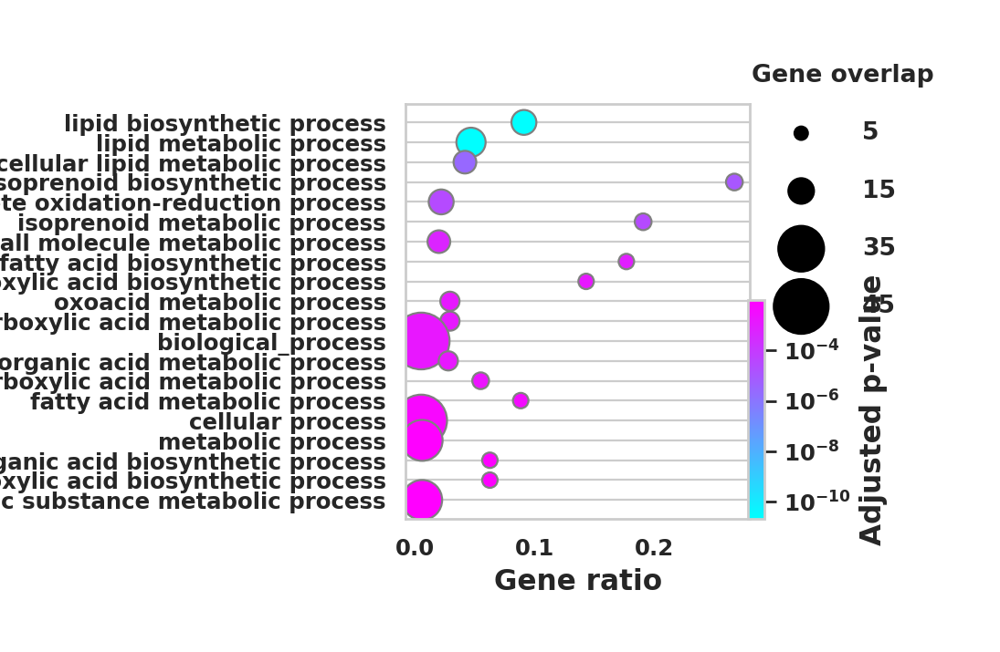

Cluster: CTCF KO_2n Hepatocytes


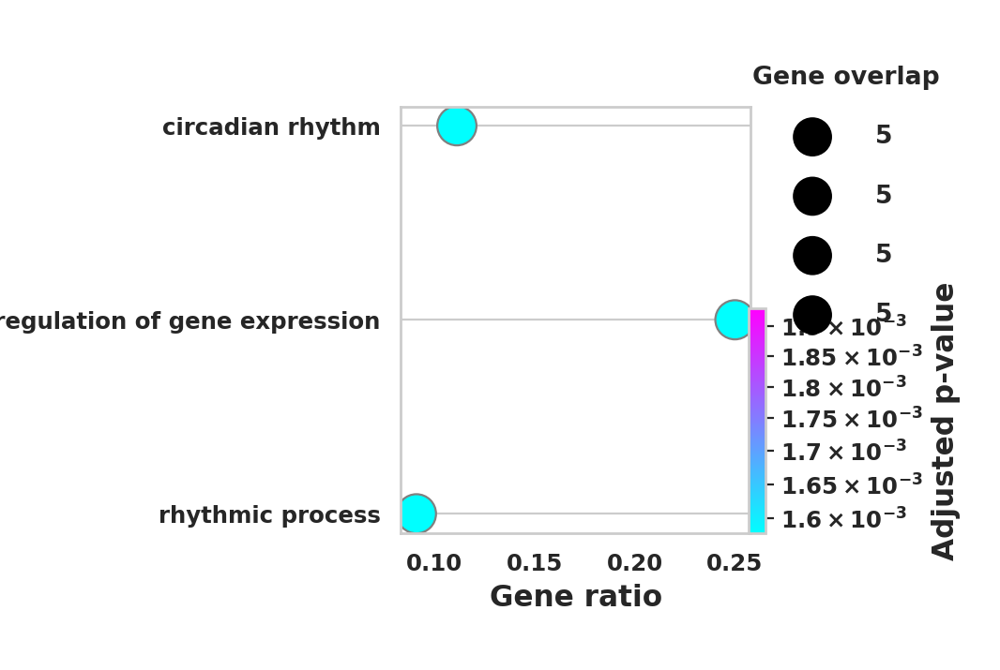

Cluster: C57Bl6J_2n Hepatocytes


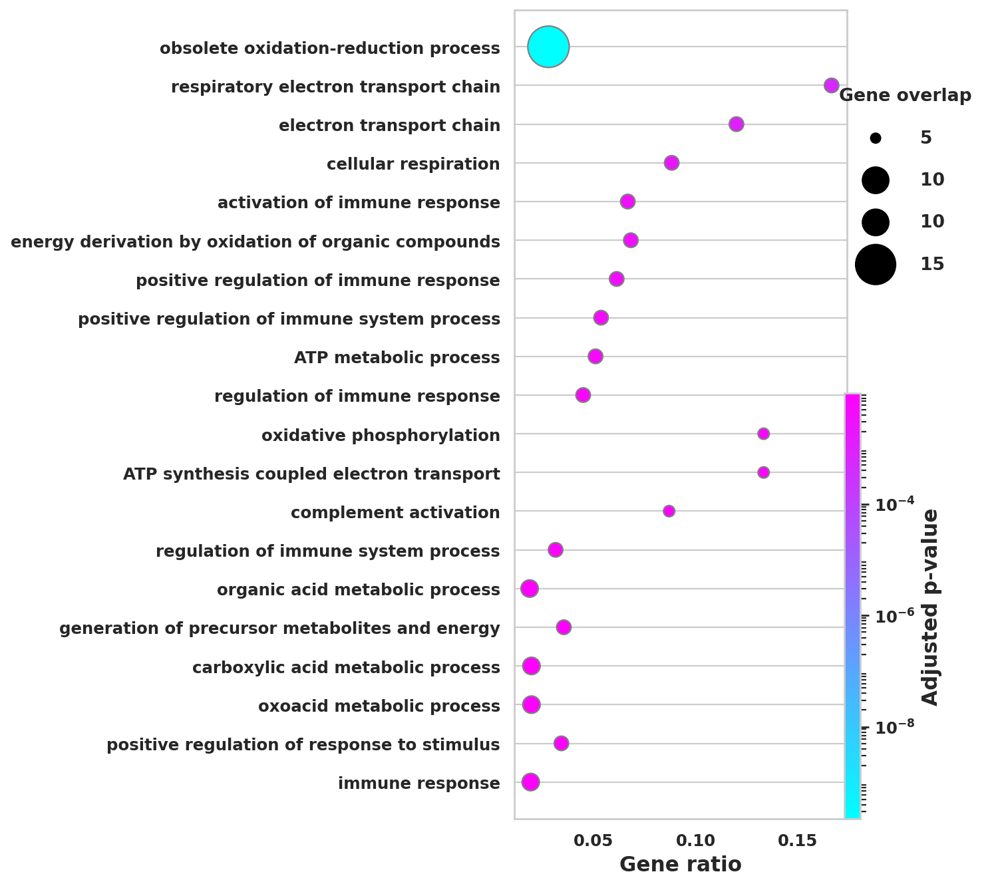

Cluster: CEBPA KO_4n Hepatocytes


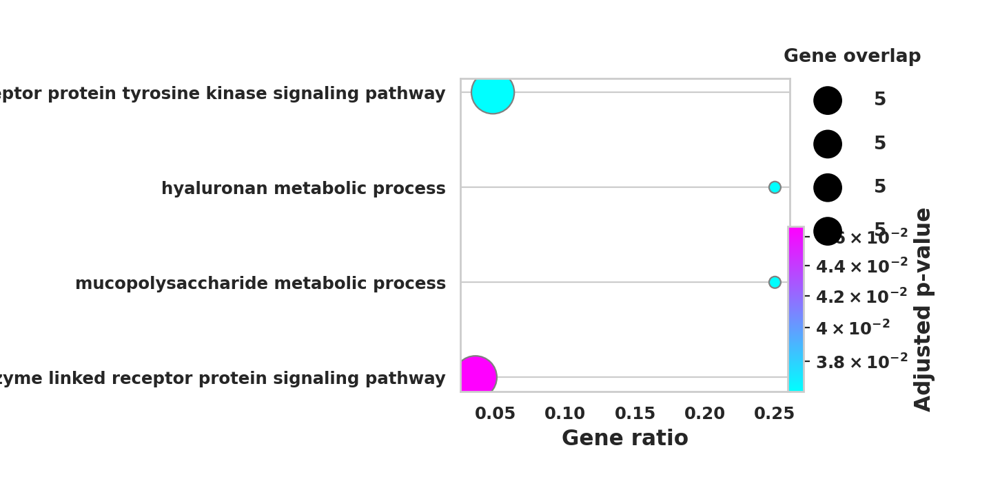

Cluster: CTCF KO_4n Hepatocytes


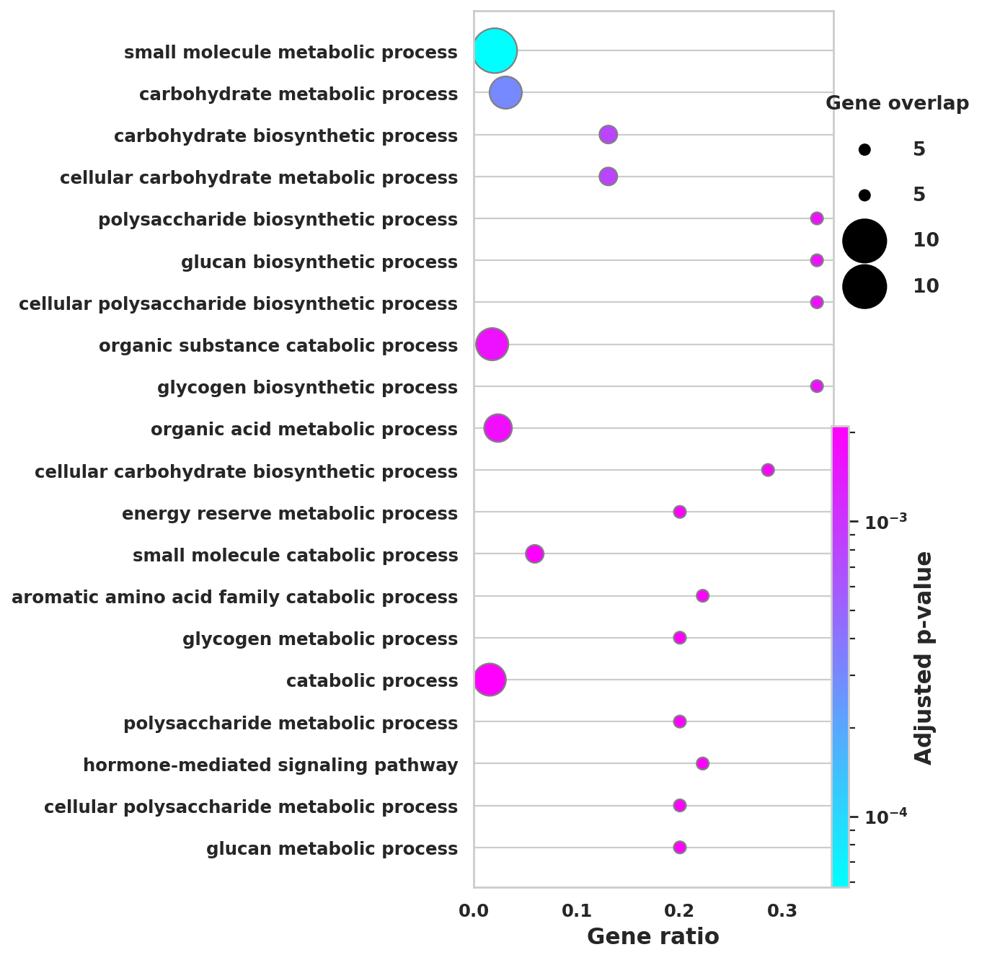

Cluster: C57Bl6J_4n Hepatocytes


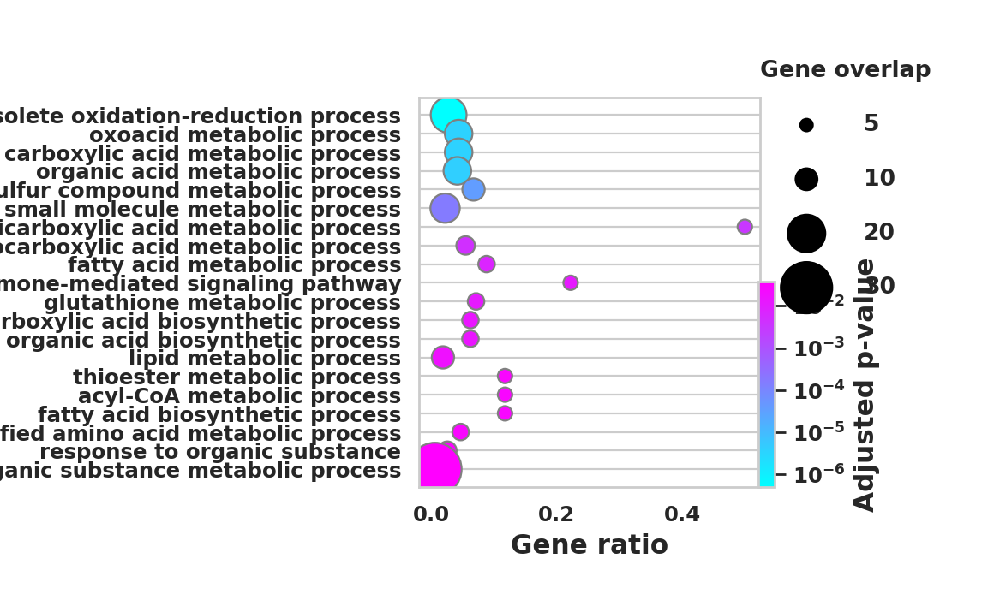

In [35]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust], 
                    save= './figures/' + today+ '_'+ clust + 
                    '_GOBP_high_in_old_condition_top100')

In [64]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['old_pvals_adj']<0.05, 
                                  np.abs(de_tmp['old_log2FC'])>0.5)
                                  ]
    if sum(de_up['old_log2FC']<0)>0:
        de_up_tmp = de_up.loc[de_up['old_log2FC']<0].sort_values('old_pvals_adj', 
                                                                 ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster HNF4 KO_4n Hepatocytes:
             p_value  term_size  intersection_size    recall  \
native                                                         
GO:0008152  0.000032       4588                 35  0.007629   
GO:1901576  0.000032       1982                 22  0.011100   
GO:0044237  0.000032       3881                 32  0.008245   
GO:0009058  0.000032       2023                 22  0.010875   
GO:0019752  0.000200        206                  7  0.033981   
GO:0043436  0.000200        206                  7  0.033981   
GO:0045333  0.000200         34                  4  0.117647   
GO:0044249  0.000200       1936                 20  0.010331   
GO:0055114  0.000202        504                 10  0.019841   
GO:0006082  0.000219        216                  7  0.032407   
GO:0015980  0.000368         44                  4  0.090909   
GO:0071704  0.000372       4410                 31  0.007029   
GO:0044281  0.000409        452                  9  0.019912   
GO:00229

Save results to file.

In [49]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_GO_high_young.csv')

Plot gene set enrichment analysis.

Cluster: HNF4 KO_4n Hepatocytes


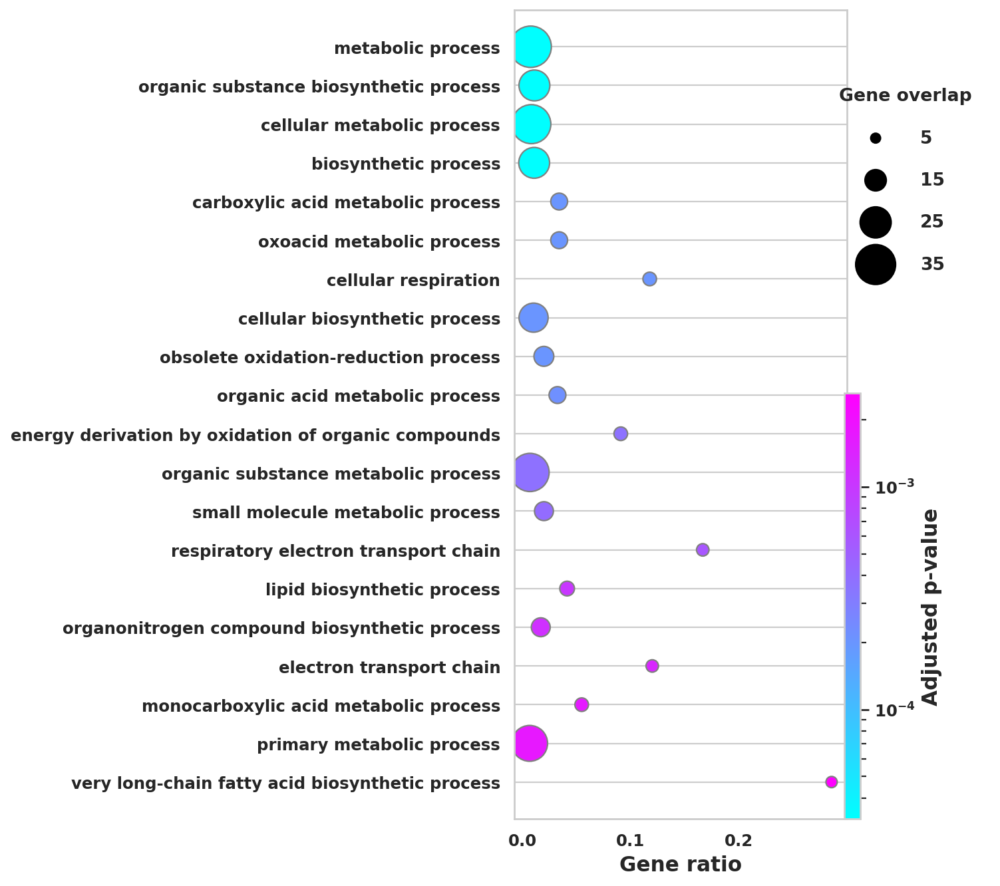

Cluster: CEBPA KO_2n Hepatocytes
Cluster: CTCF KO_2n Hepatocytes
Cluster: C57Bl6J_2n Hepatocytes
Cluster: CEBPA KO_4n Hepatocytes


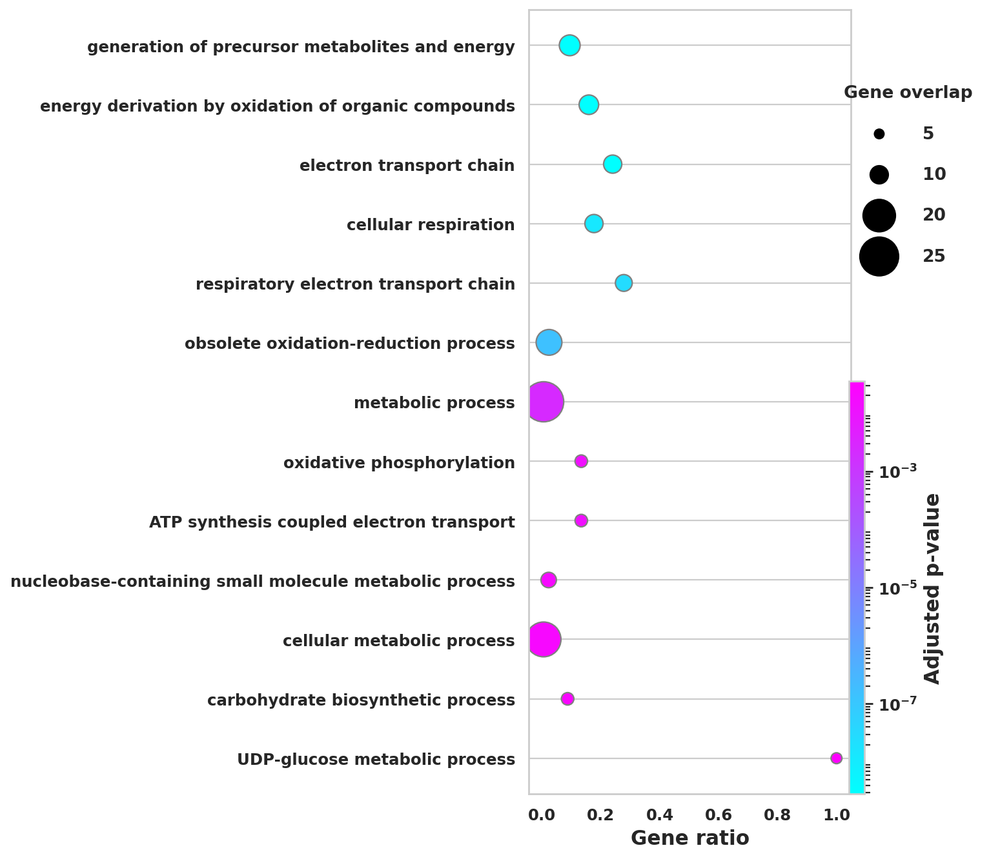

Cluster: CTCF KO_4n Hepatocytes


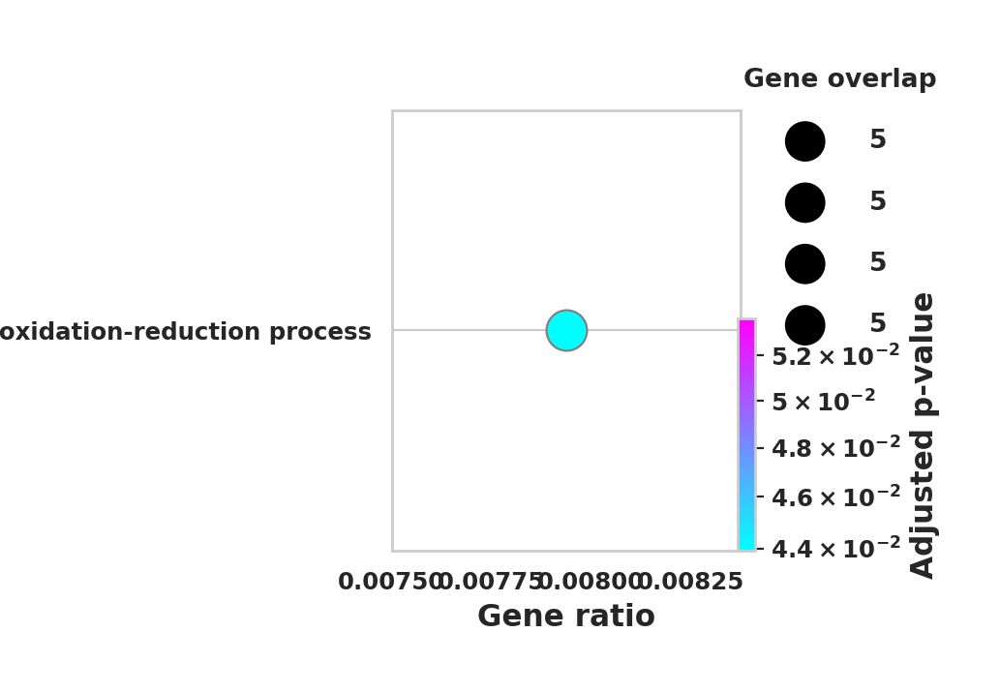

Cluster: C57Bl6J_4n Hepatocytes


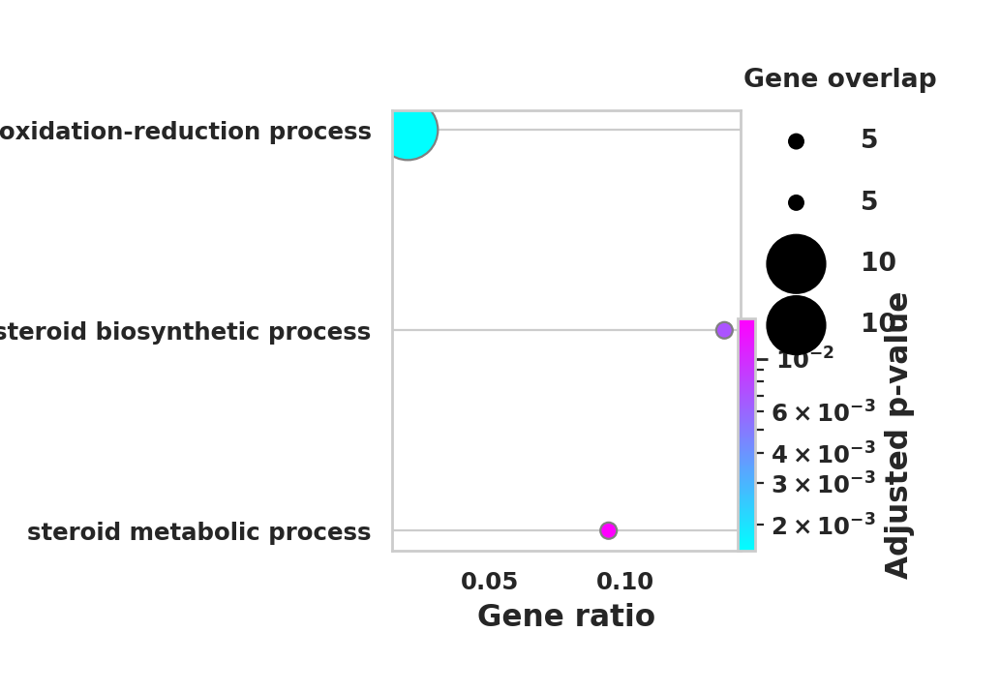

Cluster: HNF4 KO_2n Hepatocytes


In [65]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust], 
                    save= './figures/' + today+ '_'+ clust + 
                    '_GOBP_high_in_young_condition_top100')

## Biological Process KEGG term enrichment

In [51]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [19]:
test_results = dict()
for file in meta_files: 
    if file.startswith("DE_test_young"):
        title = (file.split('DE_test_young_vs_old_')[1]).split('_gene_expression_210416_filter25.csv')[0]
        print(file)
        test_results[title] = pd.read_csv(data_dir + file , index_col=0)

DE_test_young_vs_old_HNF4 KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CEBPA KO_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CTCF KO_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_C57Bl6J_2n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CEBPA KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_CTCF KO_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_C57Bl6J_4n Hepatocytes_gene_expression_210416_filter25.csv
DE_test_young_vs_old_HNF4 KO_2n Hepatocytes_gene_expression_210416_filter25.csv


In [52]:
de_signif = test_results

In [53]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['old_pvals_adj']<0.05, 
                                  np.abs(de_tmp['old_log2FC'])>0.5)
                                  ]
    if sum(de_up['old_log2FC']>0)>0:
        de_up_tmp = de_up.loc[de_up['old_log2FC']>0].sort_values('old_pvals_adj', ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster HNF4 KO_4n Hepatocytes:
                 p_value  term_size  intersection_size    recall  \
native                                                             
KEGG:01100  1.390906e-11       1480                 26  0.017568   
KEGG:00000  1.698996e-05       7213                 44  0.006100   
KEGG:01212  3.631127e-05         61                  5  0.081967   
KEGG:00100  3.868683e-04         18                  3  0.166667   
KEGG:00061  3.868683e-04         18                  3  0.166667   
KEGG:00900  6.030940e-04         22                  3  0.136364   
KEGG:03320  1.564171e-03         83                  4  0.048193   
KEGG:01040  1.564171e-03         33                  3  0.090909   
KEGG:00620  2.868177e-03         42                  3  0.071429   
KEGG:04152  4.813638e-03        122                  4  0.032787   
KEGG:04910  5.704248e-03        134                  4  0.029851   
KEGG:00561  5.704248e-03         58                  3  0.051724   
KEGG:00010  5.97

Save results to file.

In [54]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_KEGG_high_old.csv')

Plot gene set enrichment analysis.

In [57]:
de_gobp_enrich[clust].drop('KEGG:00000')

,p_value,term_size,intersection_size,recall,name,intersections
native,,,,,,
KEGG:01100,4.181962e-12,1480,28,0.018919,Metabolic pathways,"[Elovl5, Scd1, Cyp4a14, Cyp2b9, Acacb, Got1, G..."
KEGG:03320,7.967314e-07,83,7,0.084337,PPAR signaling pathway,"[Scd1, Cyp4a14, Pltp, Me1, Cyp4a10, Plin4, Cd36]"
KEGG:00830,1.988572e-05,91,6,0.065934,Retinol metabolism,"[Cyp4a14, Cyp2b9, Cyp2c38, Rdh16, Cyp4a10, Cyp..."
KEGG:05204,2.320619e-05,97,6,0.061856,Chemical carcinogenesis,"[Cyp2b9, Cyp2c38, Gstt3, Cyp2c37, Gstm1, Gsta2]"
KEGG:00590,8.457864e-05,73,5,0.068493,Arachidonic acid metabolism,"[Cyp4a14, Cyp2b9, Cyp2c38, Cyp4a10, Cyp2c37]"
KEGG:01230,8.457864e-05,72,5,0.069444,Biosynthesis of amino acids,"[Got1, Glul, Cth, Pklr, Idh2]"
KEGG:00620,1.863435e-04,42,4,0.095238,Pyruvate metabolism,"[Acacb, Me1, Aldh3a2, Pklr]"
KEGG:00330,3.338832e-04,50,4,0.080000,Arginine and proline metabolism,"[Got1, Oat, Aldh3a2, Aoc1]"
KEGG:04750,7.178663e-04,122,5,0.040984,Inflammatory mediator regulation of TRP channels,"[Cyp4a14, Cyp2c38, Cyp4a10, Igf1, Cyp2c37]"


Cluster: HNF4 KO_4n Hepatocytes


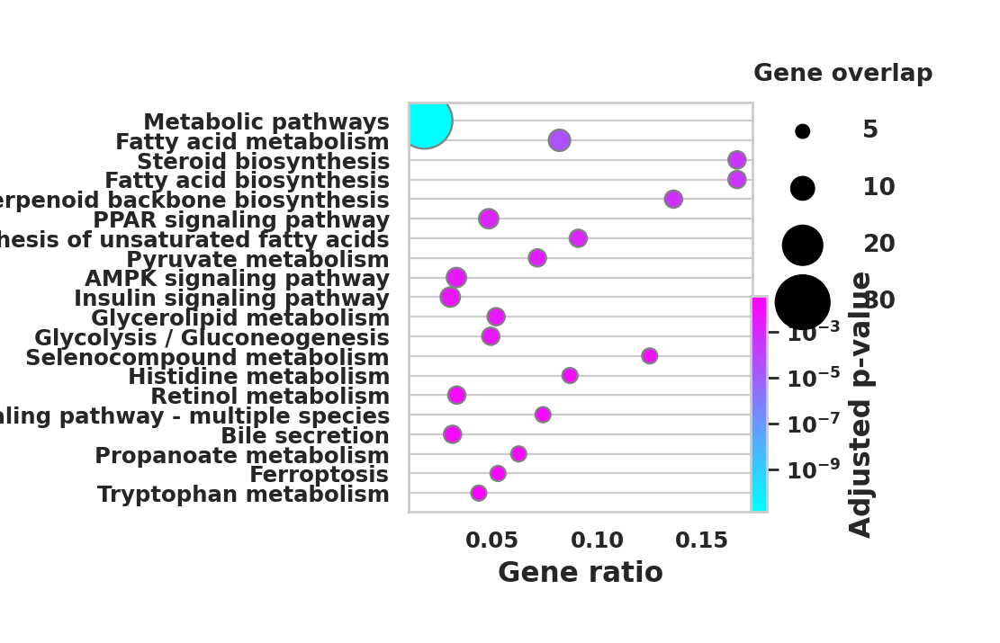

Cluster: CTCF KO_2n Hepatocytes
Cluster: C57Bl6J_2n Hepatocytes


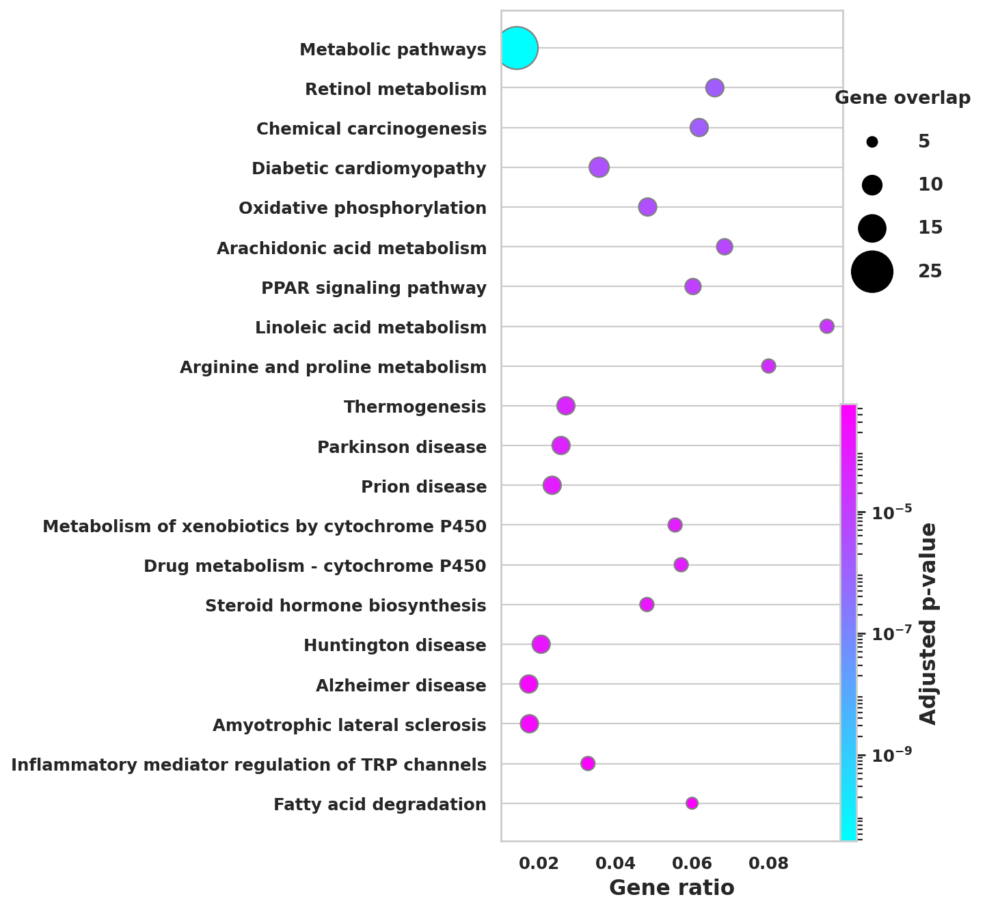

Cluster: CEBPA KO_4n Hepatocytes


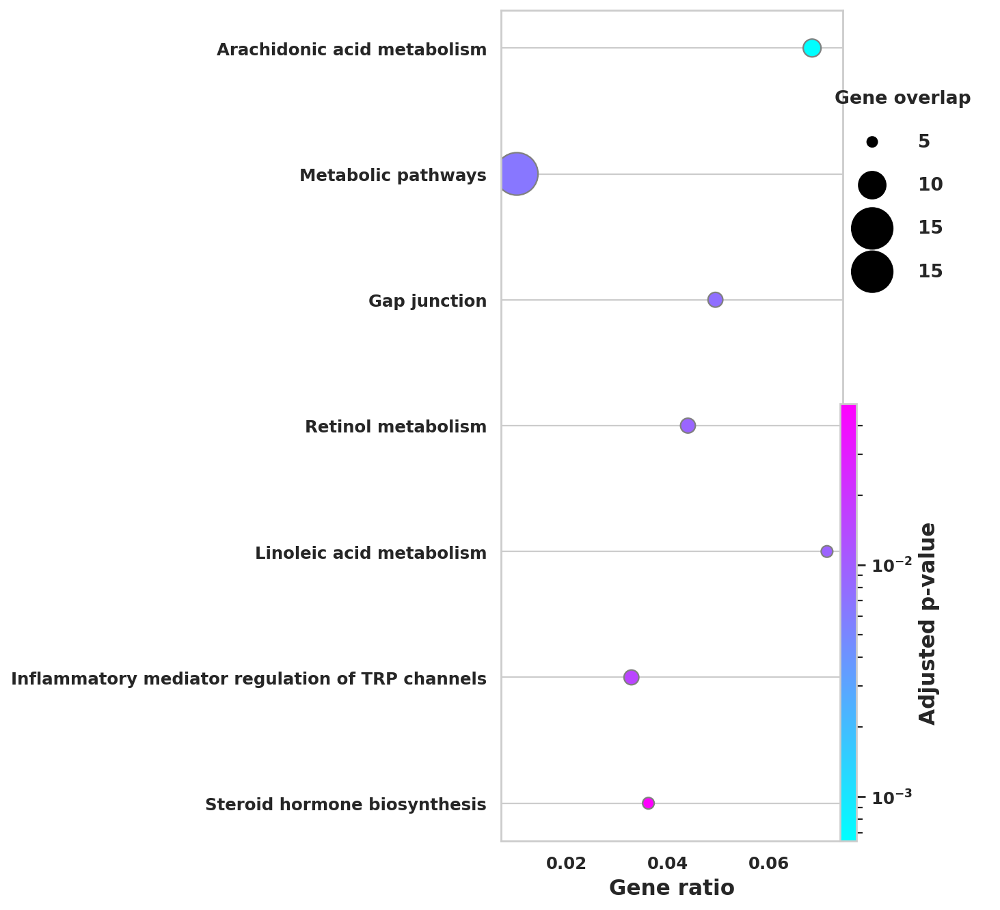

Cluster: CTCF KO_4n Hepatocytes


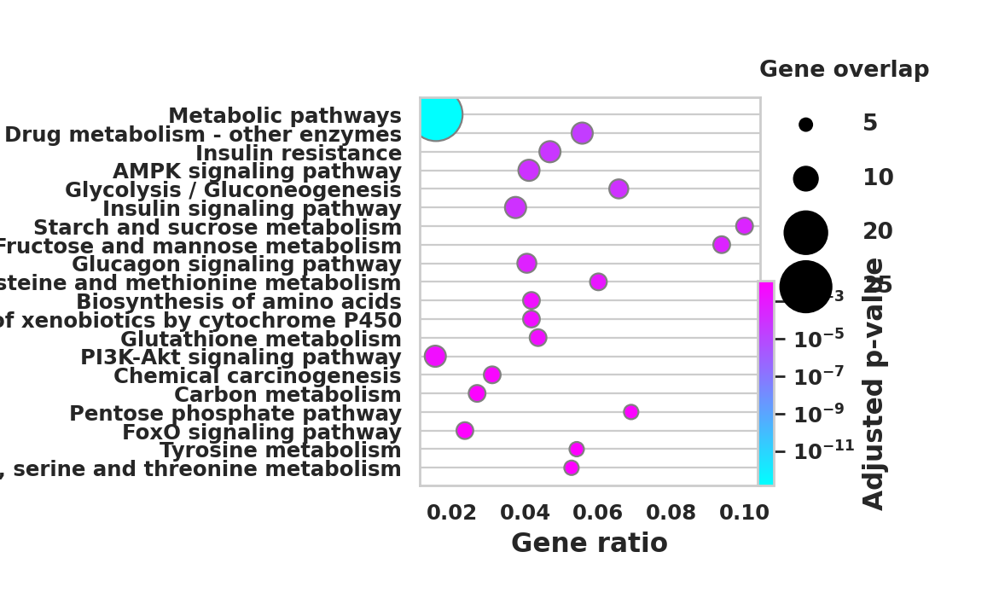

Cluster: C57Bl6J_4n Hepatocytes


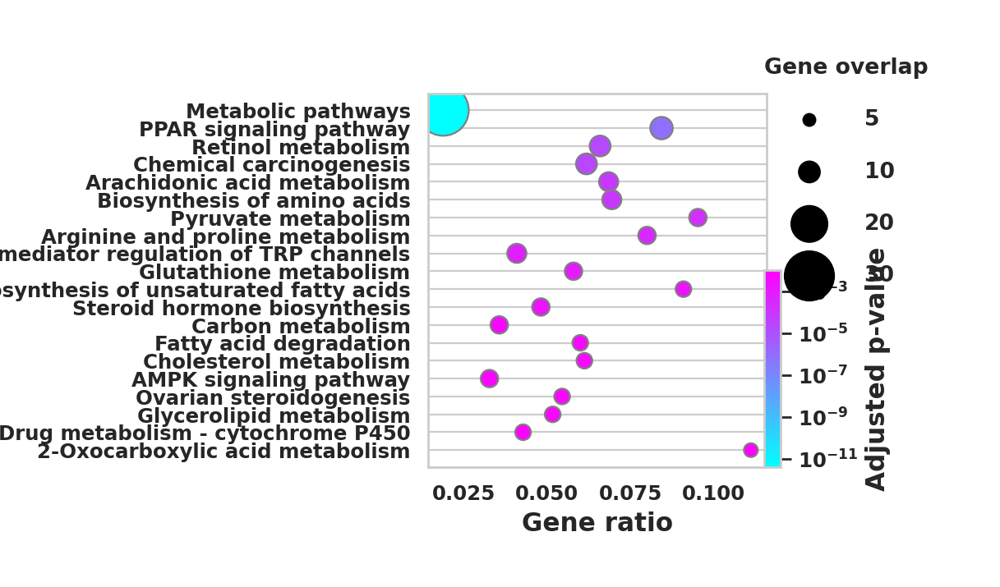

In [59]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        #remove KEGG root term and plot
        plot_enrich(de_gobp_enrich[clust].drop('KEGG:00000'), 
                    save= './figures/' + today+ '_'+ clust + '_KEGG_high_in_old_condition_top100')

In [60]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['old_pvals_adj']<0.05, 
                                  np.abs(de_tmp['old_log2FC'])>0.5)
                                  ]
    if sum(de_up['old_log2FC']<0)>0:
        de_up_tmp = de_up.loc[de_up['old_log2FC']<0].sort_values('old_pvals_adj', 
                                                                 ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster HNF4 KO_4n Hepatocytes:
                 p_value  term_size  intersection_size    recall  \
native                                                             
KEGG:00000  2.849832e-08       7213                 52  0.007209   
KEGG:01100  2.849832e-08       1480                 23  0.015541   
KEGG:05415  2.097005e-04        196                  7  0.035714   
KEGG:05012  4.871498e-04        233                  7  0.030043   
KEGG:05020  5.957941e-04        256                  7  0.027344   
KEGG:04922  5.957941e-04         99                  5  0.050505   
KEGG:00190  1.324641e-03        124                  5  0.040323   
KEGG:05022  2.286650e-03        447                  8  0.017897   
KEGG:00140  3.012205e-03         83                  4  0.048193   
KEGG:05215  4.937460e-03         97                  4  0.041237   
KEGG:05016  6.070508e-03        292                  6  0.020548   
KEGG:04714  1.080274e-02        222                  5  0.022523   
KEGG:05010  1.08

Save results to file.

In [61]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_KEGG_high_young.csv')

Plot gene set enrichment analysis.

Cluster: HNF4 KO_4n Hepatocytes


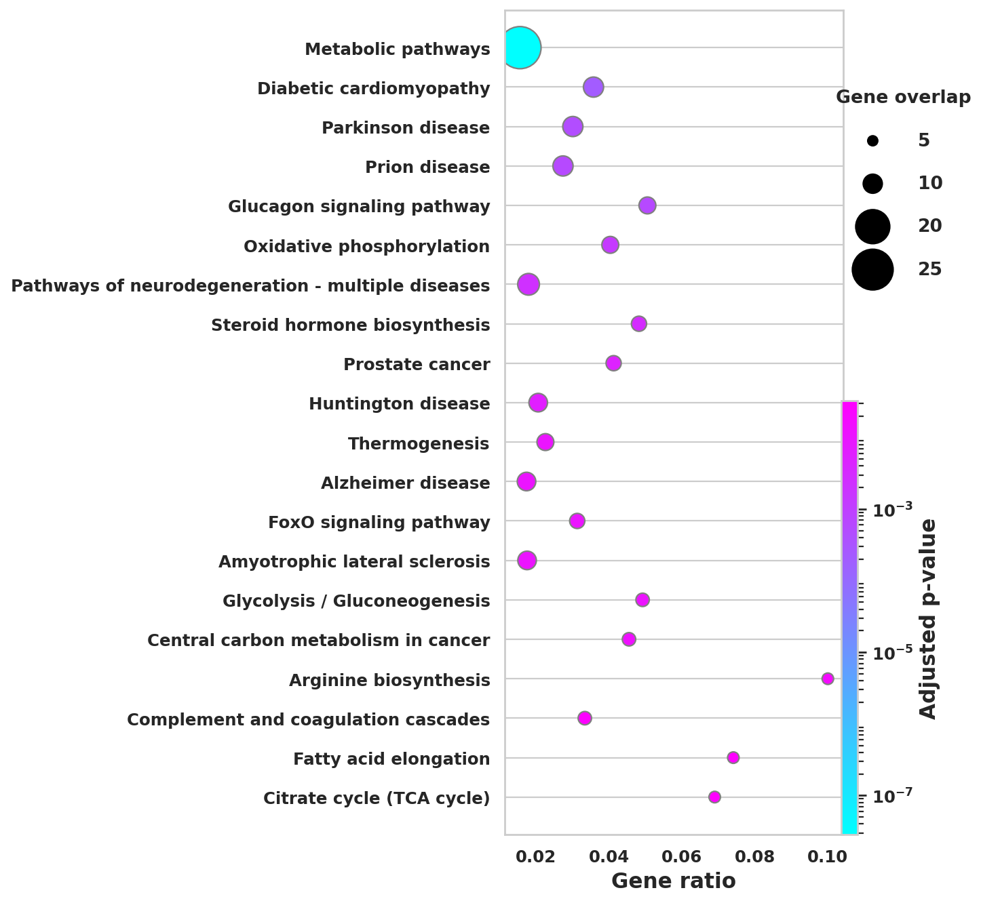

Cluster: CEBPA KO_2n Hepatocytes
Cluster: CTCF KO_2n Hepatocytes


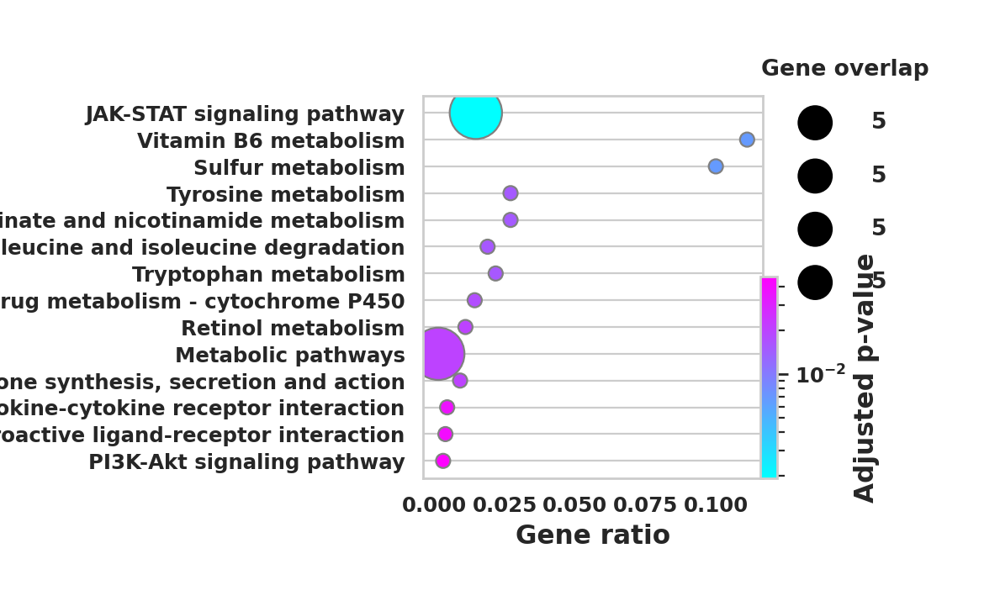

Cluster: C57Bl6J_2n Hepatocytes
Cluster: CEBPA KO_4n Hepatocytes


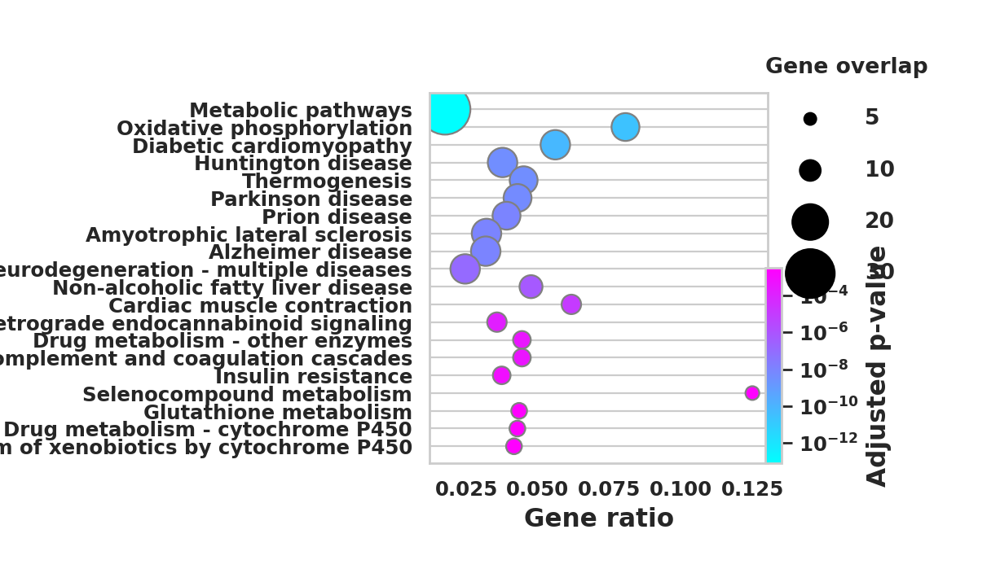

Cluster: CTCF KO_4n Hepatocytes


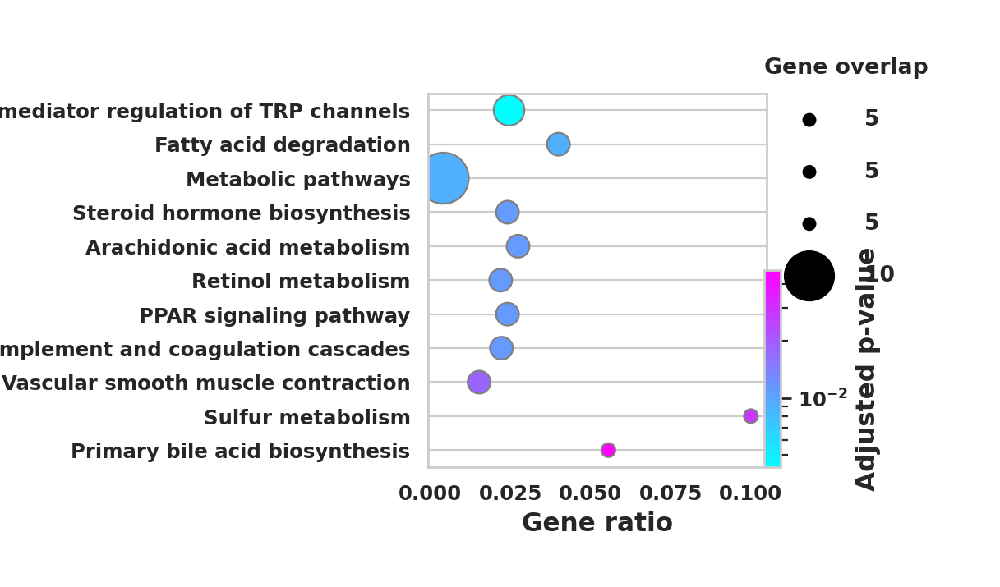

Cluster: C57Bl6J_4n Hepatocytes


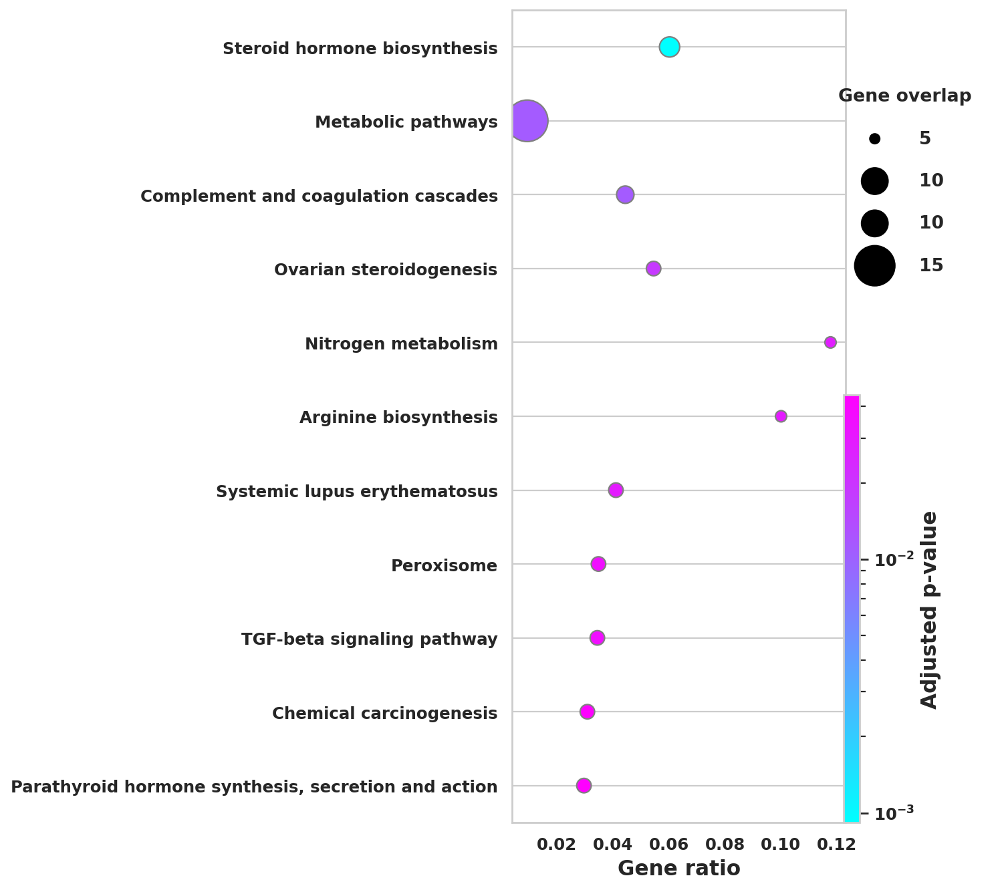

Cluster: HNF4 KO_2n Hepatocytes


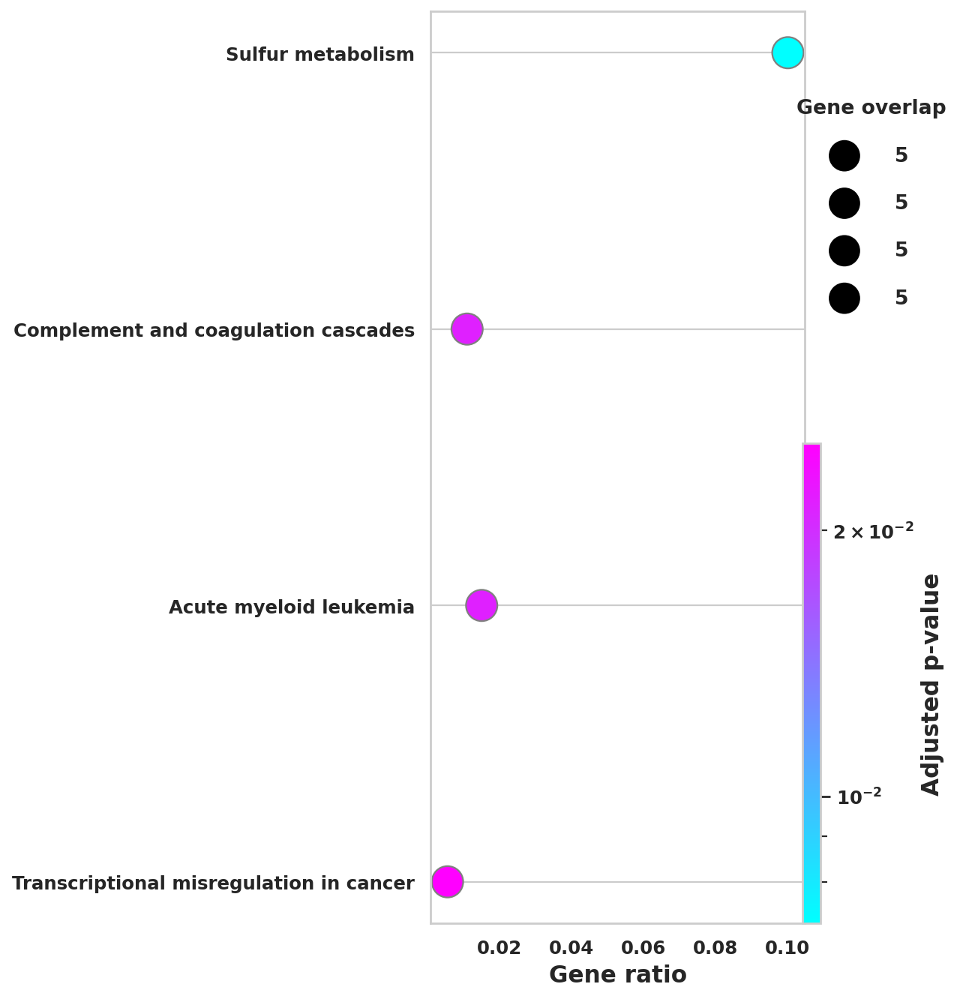

In [63]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust].drop('KEGG:00000'), 
                    save= './figures/' + today+ '_'+ clust + 
                    '_KEGG_high_in_young_condition_top100')

# Perform GSEA of wild type vs KO

In this section, we select the cell type accounting for ploidy and age group, *i.e.* we compare young and old, 2n and 4n hepatocytes in wild type vs KO, respectively.

Use only top 100 DE genes.

## Biological Process GO term enrichment

In [29]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [31]:
test_results = dict()
for file in meta_files: 
    if file.startswith("DE_test_KO_"):
        title = (file.split('DE_test_KO_')[1]).split('_gene_expression_210906_filter25.csv')[0]
        print(file)
        test_results[title] = pd.read_csv(table_dir + file , index_col=0)

DE_test_KO_CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv


In [32]:
de_signif = test_results

In [33]:
de_signif.keys()

dict_keys(['CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv', 'CEBPA KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv', 'CTCF KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv', 'HNF4 KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv', 'HNF4 KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv', 'CTCF KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv', 'HNF4 KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv', 'HNF4 KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv', 'CTCF KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv', 'CEBPA KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv', 'CEBPA KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv', 'CTCF KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv'])

In [35]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['C57Bl6/J_pvals_adj']<0.05, 
                                  np.abs(de_tmp['C57Bl6/J_log2FC'])>0.5)
                                  ]
    if sum(de_up['C57Bl6/J_log2FC']>0)>0:
        de_up_tmp = de_up.loc[de_up['C57Bl6/J_log2FC']>0].sort_values('C57Bl6/J_pvals_adj', 
                                                                      ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv:
                 p_value  term_size  intersection_size    recall  \
native                                                             
GO:0022900  1.086695e-08        132                 10  0.075758   
GO:0022904  1.086695e-08         85                  9  0.105882   
GO:0042773  1.554392e-08         64                  8  0.125000   
GO:0019646  1.105771e-07         51                  7  0.137255   
GO:0015988  1.436647e-07          5                  4  0.800000   
GO:0015990  1.436647e-07          5                  4  0.800000   
GO:0055114  1.577196e-07        509                 14  0.027505   
GO:0042775  2.026080e-07         62                  7  0.112903   
GO:0019752  2.026080e-07        850                 17  0.020000   
GO:0043436  2.026080e-07        859                 17  0.019790   
GO:0006082  3.302522e-07        893                 17  0.019037   
GO:0006119  3.702626e-07        112  

Save results to file.

In [29]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(table_dir + today + '_' + clust + '_GO_high_KO.csv')

Plot gene set enrichment analysis.

Cluster: CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv


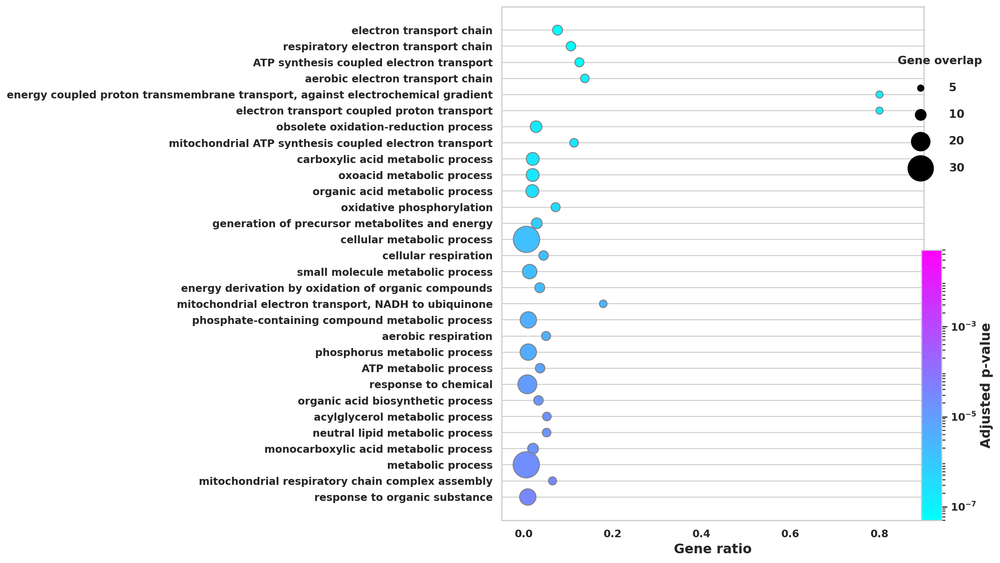

Cluster: CEBPA KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv


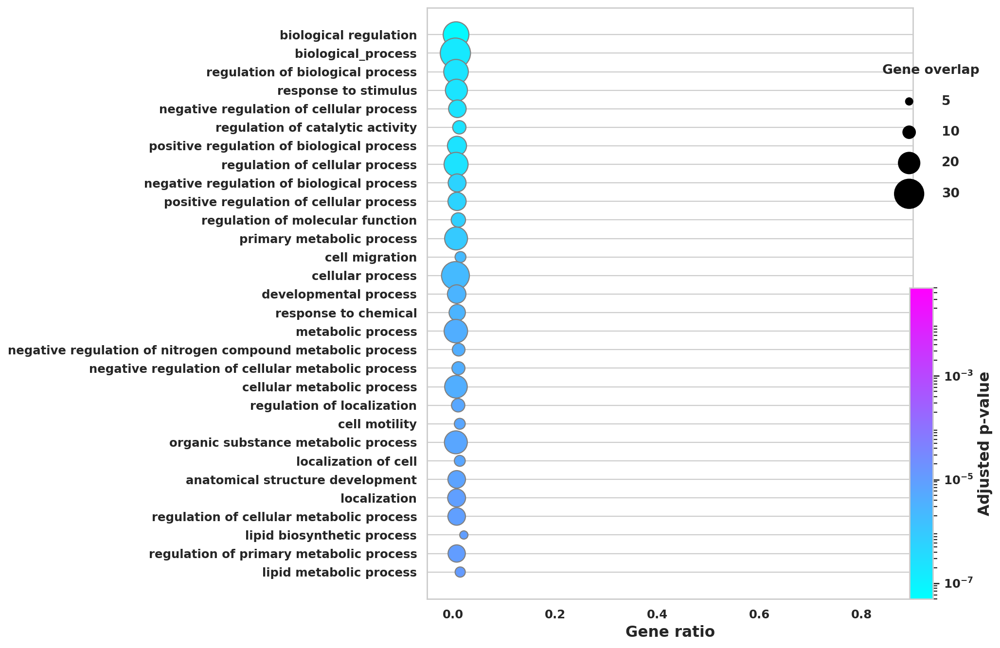

Cluster: CTCF KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv


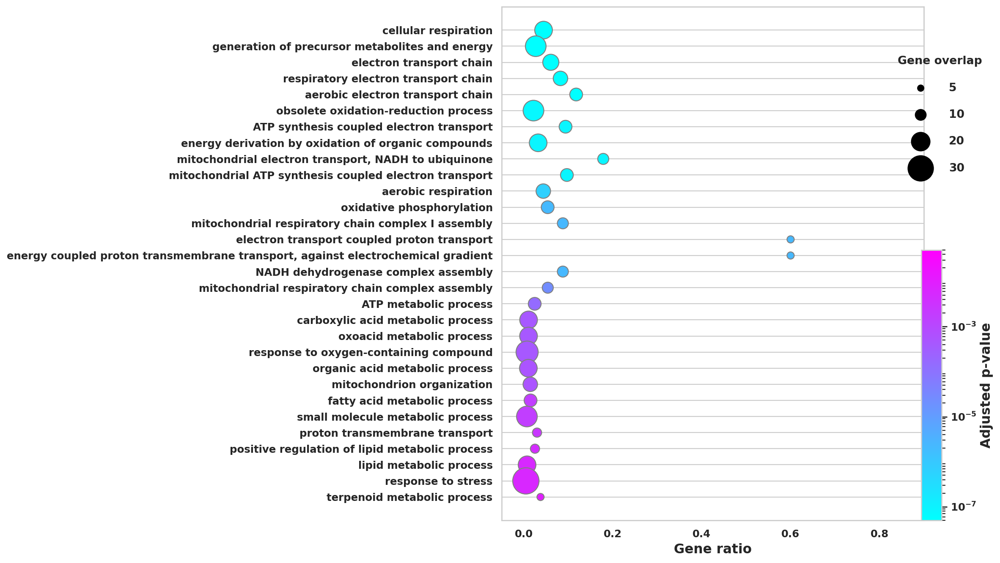

Cluster: HNF4 KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv


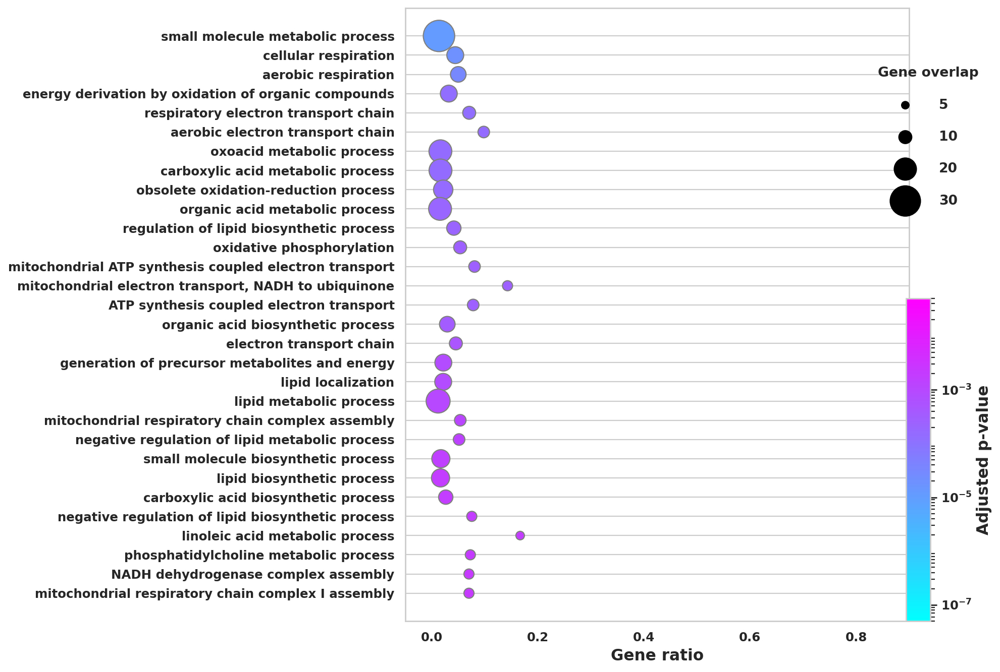

Cluster: HNF4 KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv


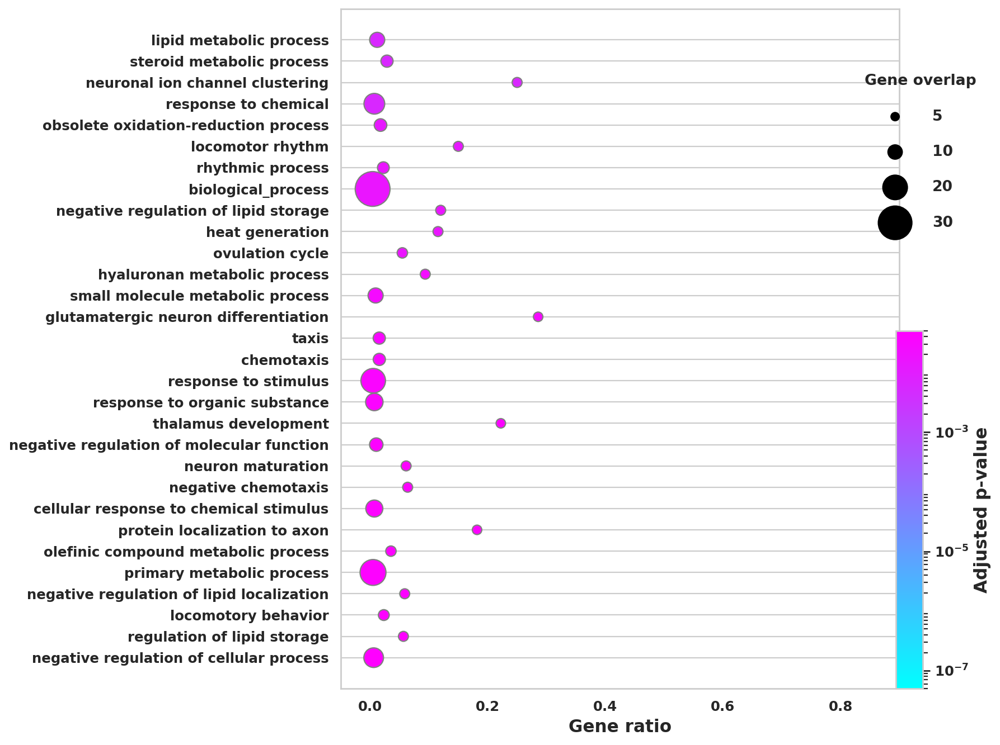

Cluster: CTCF KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv


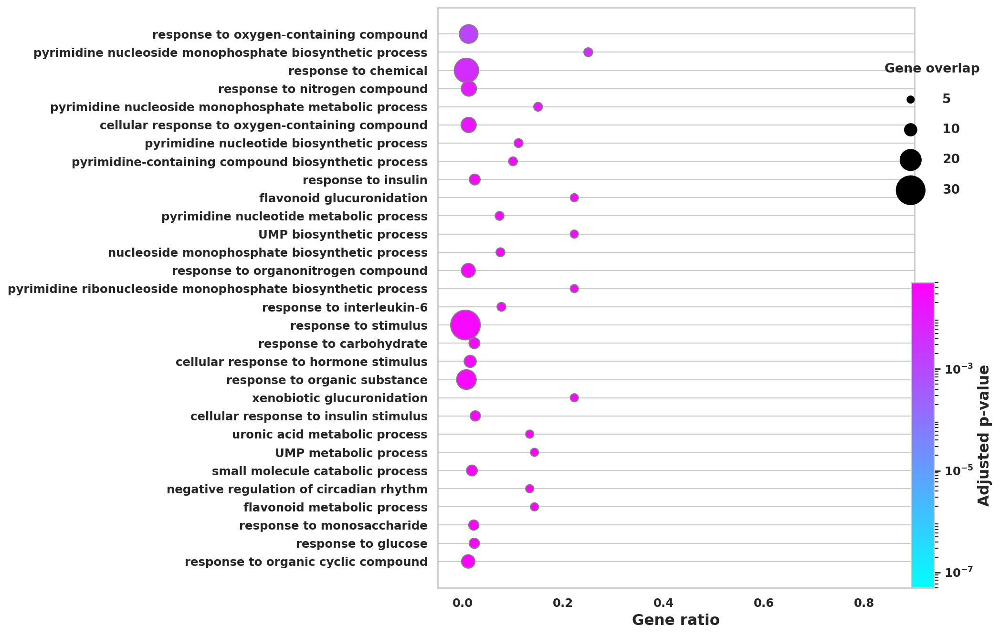

Cluster: HNF4 KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv


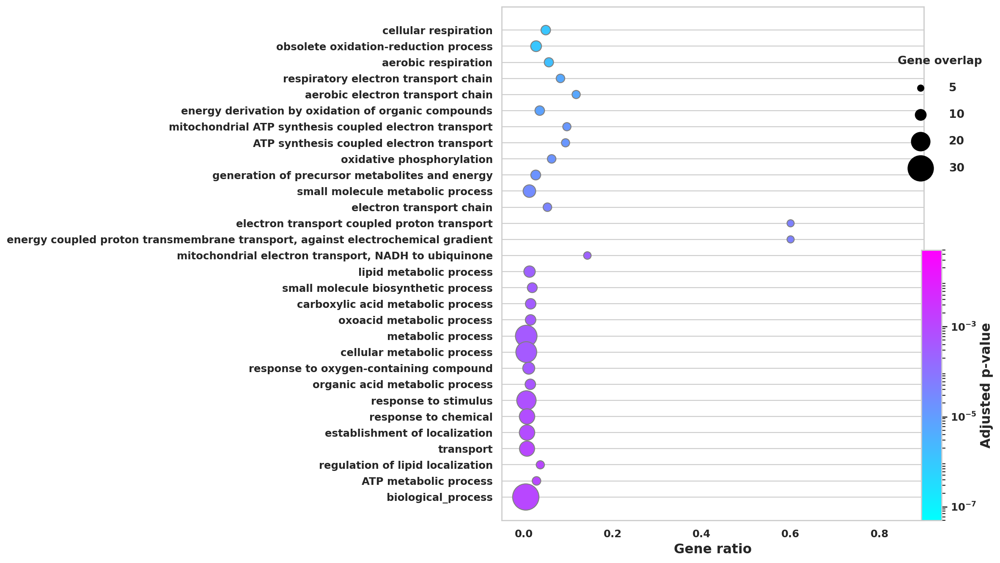

Cluster: HNF4 KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
Cluster: CTCF KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv


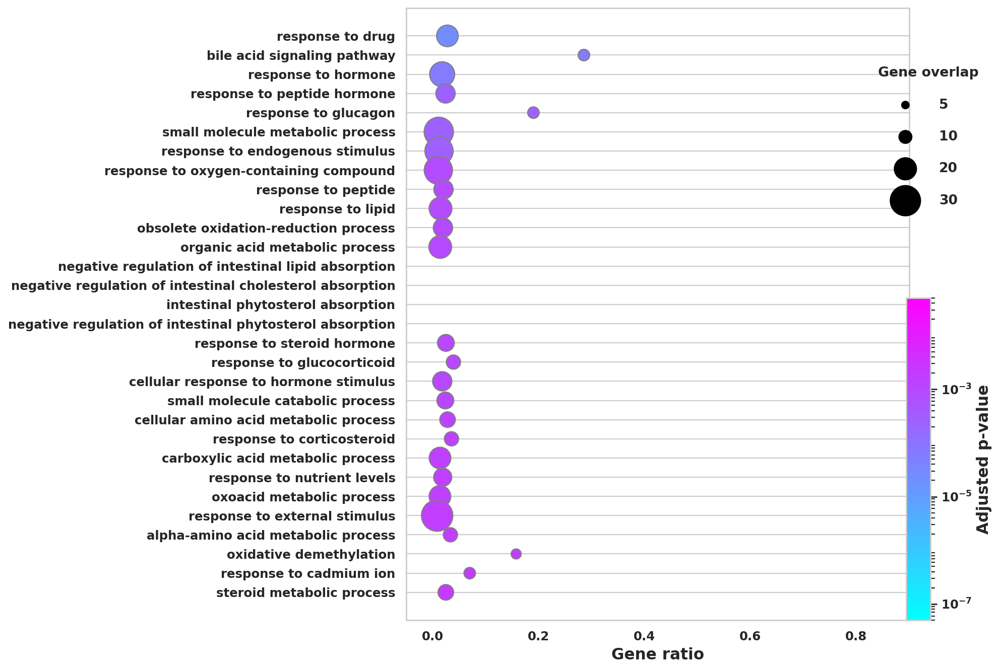

Cluster: CEBPA KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv


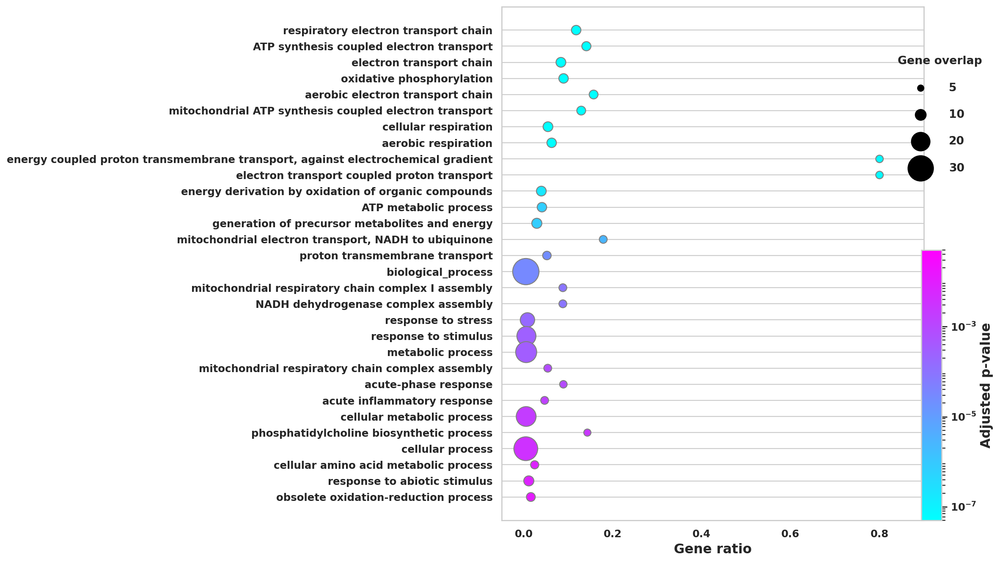

Cluster: CEBPA KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv


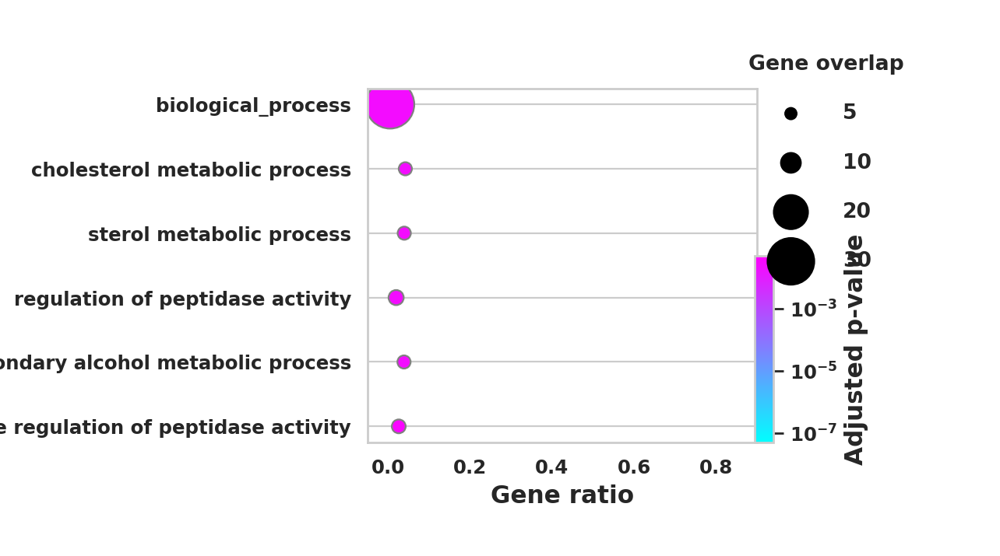

Cluster: CTCF KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv


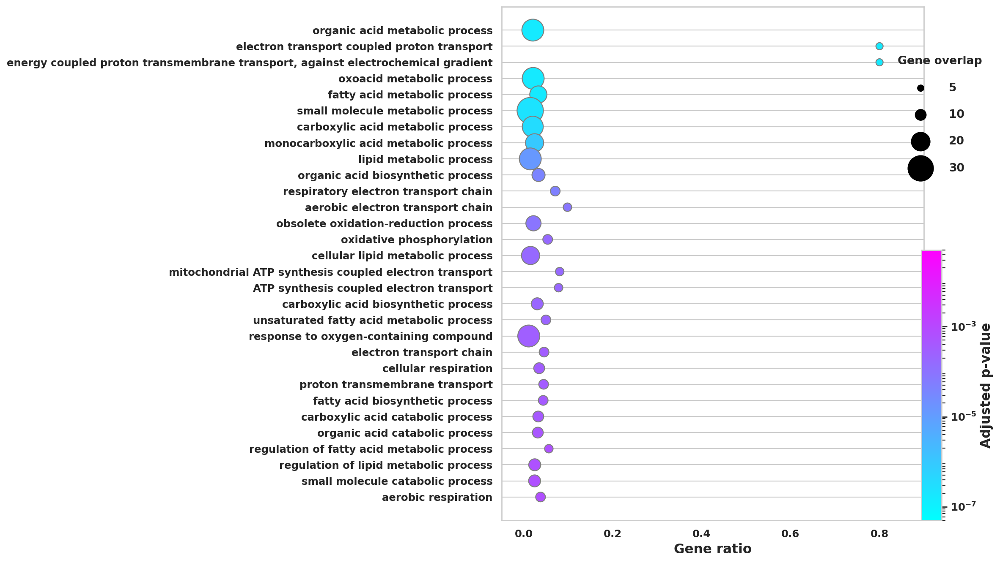

In [54]:
rcParams['figure.figsize']=(10,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust], n_terms=30, 
                    pmax = 0.05, pmin = 5e-8,
                    olap_min = 1, olap_max = 30, 
                    xlim= [-0.05, 0.9],
                    save= './figures/' + today+ '_'+ clust + 
                    '_GOBP_high_in_KO_condition_top100.pdf')

In [31]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['C57Bl6/J_pvals_adj']<0.05, 
                                  np.abs(de_tmp['C57Bl6/J_log2FC'])>0.5)
                                  ]
    if sum(de_up['C57Bl6/J_log2FC']<0)>0:
        de_up_tmp = de_up.loc[de_up['C57Bl6/J_log2FC']<0].sort_values('C57Bl6/J_pvals_adj', 
                                                                 ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster CEBPA KO_vs_WT_young_4n Hepatocytes:
                 p_value  term_size  intersection_size    recall  \
native                                                             
GO:0044281  2.842189e-09        452                 15  0.033186   
GO:0005975  2.594719e-05        196                  8  0.040816   
GO:0055086  1.293887e-04        177                  7  0.039548   
GO:0019752  1.609146e-04        206                  7  0.033981   
GO:0055114  1.609146e-04        504                 10  0.019841   
GO:0008152  1.609146e-04       4588                 32  0.006975   
GO:0043436  1.609146e-04        206                  7  0.033981   
GO:0071704  1.621782e-04       4410                 31  0.007029   
GO:0006082  1.621782e-04        216                  7  0.032407   
GO:0009117  1.758367e-04        145                  6  0.041379   
GO:0006753  2.017085e-04        151                  6  0.039735   
GO:0006790  2.047633e-04         89                  5  0.056180   
GO:

Save results to file.

In [32]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_GO_high_WT.csv')

Plot gene set enrichment analysis.

Cluster: CEBPA KO_vs_WT_young_4n Hepatocytes


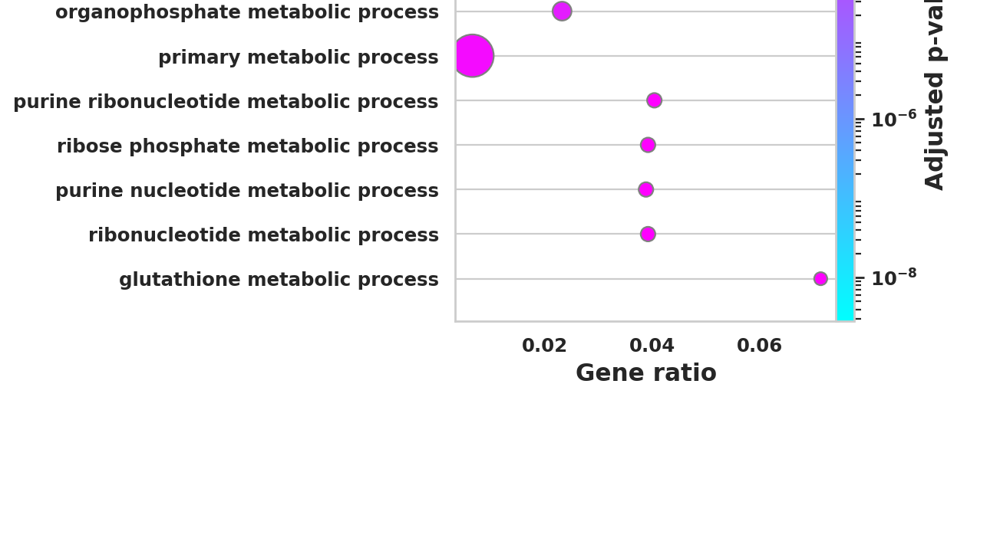

Cluster: CTCF KO_vs_WT_old_4n Hepatocytes


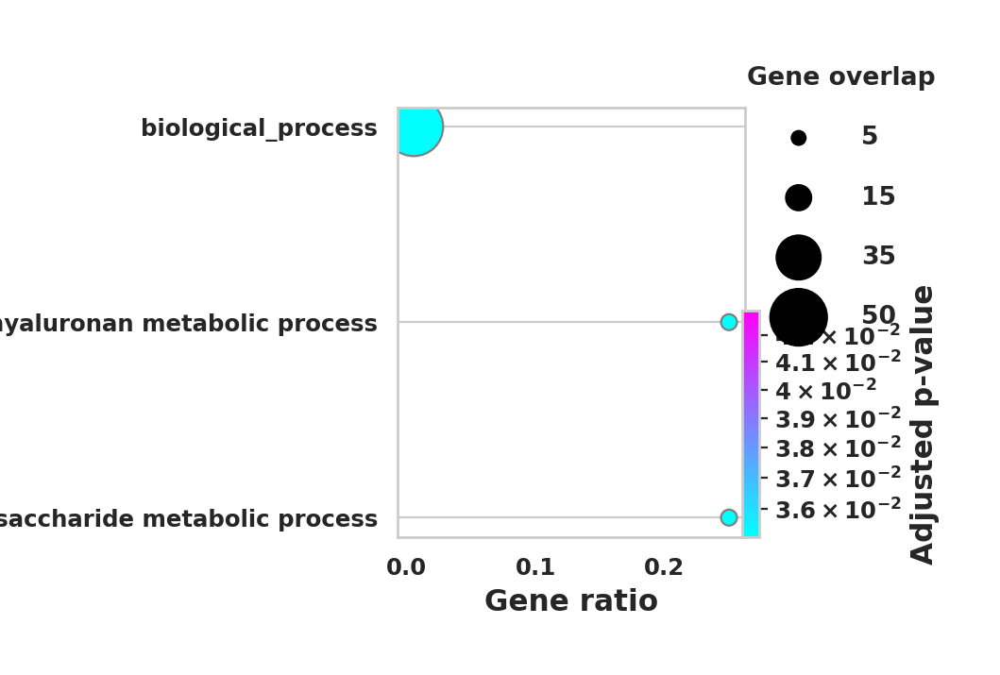

Cluster: CEBPA KO_vs_WT_old_4n Hepatocytes


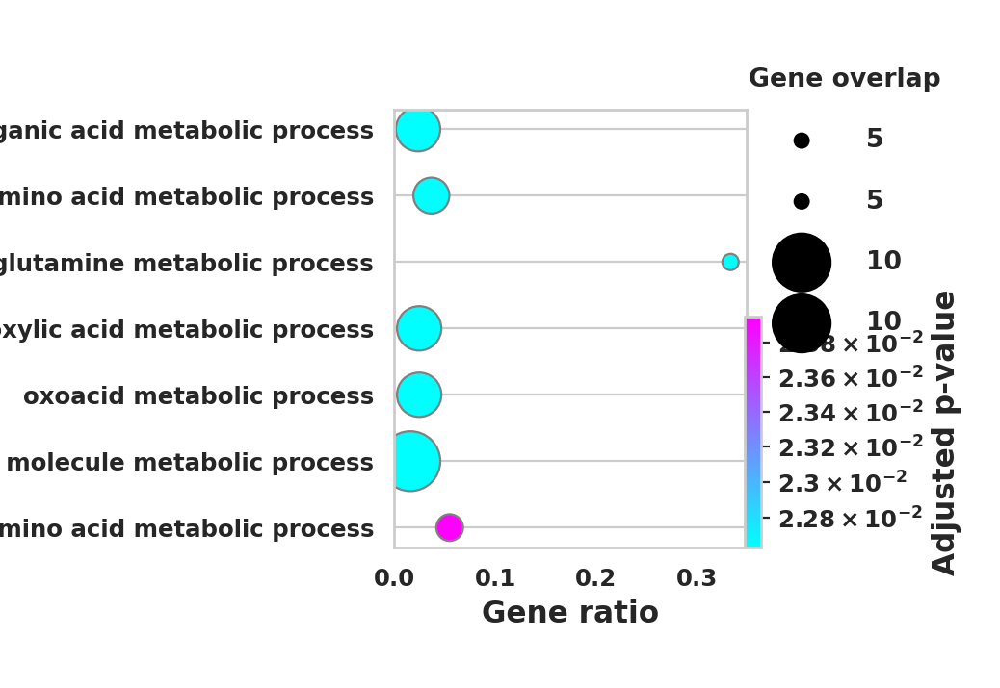

Cluster: CTCF KO_vs_WT_young_4n Hepatocytes


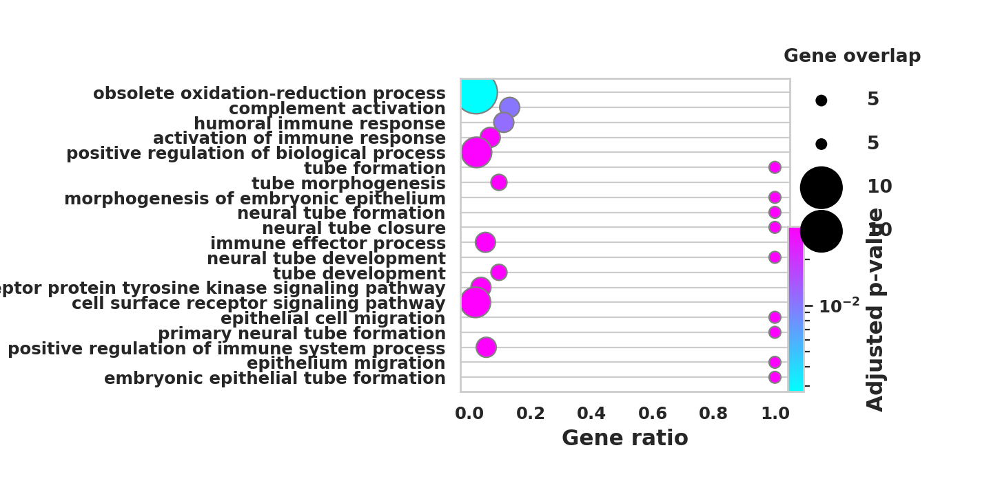

Cluster: HNF4 KO_vs_WT_old_2n Hepatocytes
Cluster: HNF4 KO_vs_WT_young_2n Hepatocytes


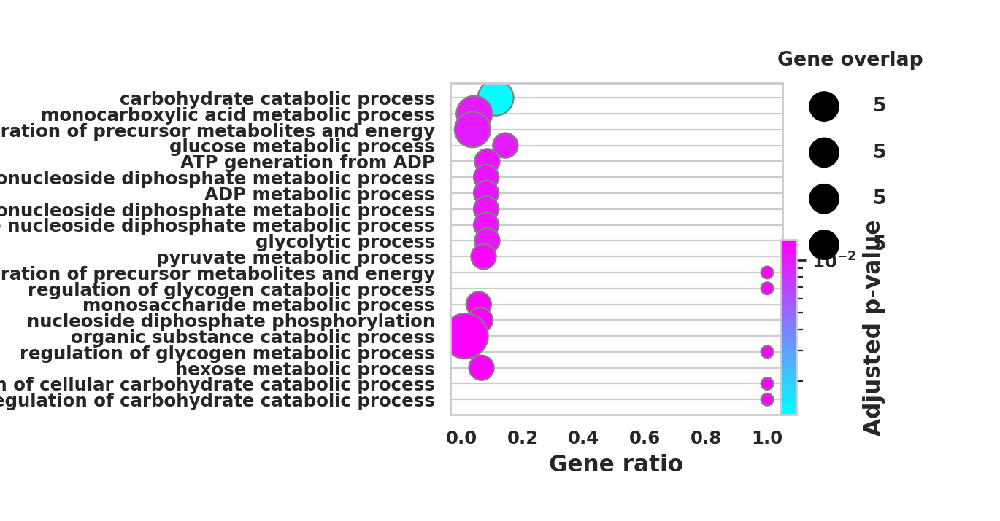

Cluster: CTCF KO_vs_WT_young_2n Hepatocytes


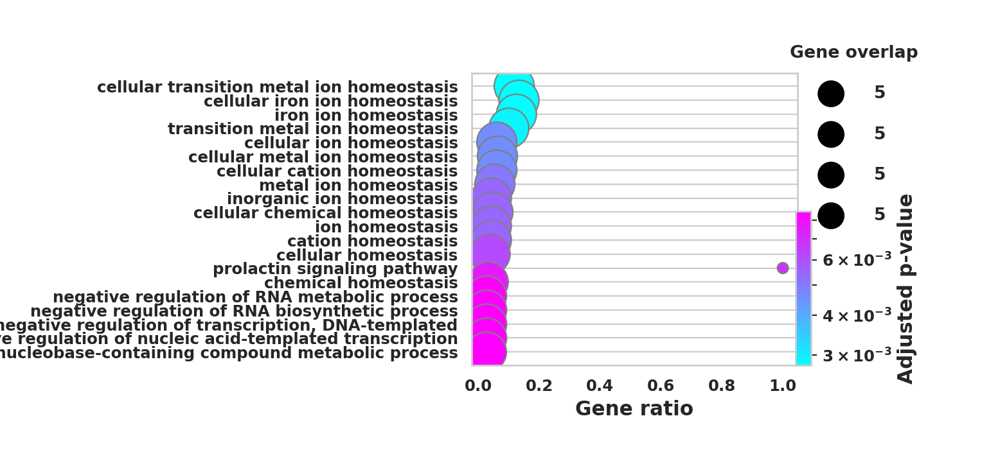

Cluster: HNF4 KO_vs_WT_old_4n Hepatocytes


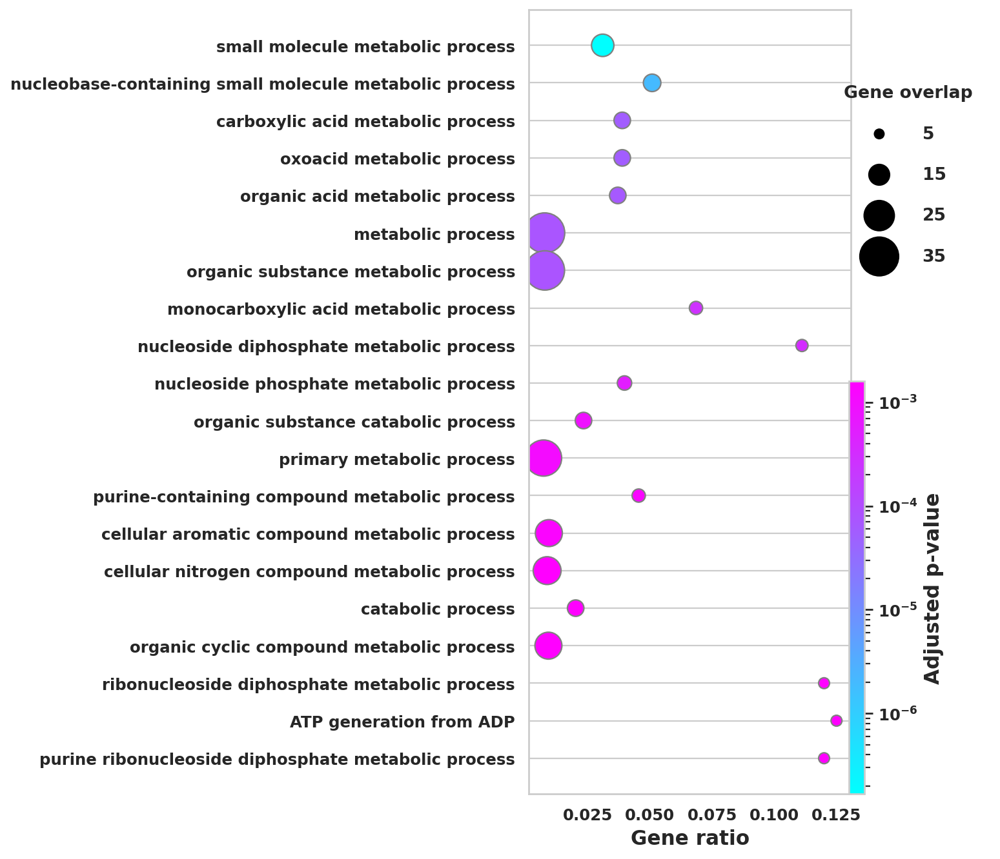

Cluster: HNF4 KO_vs_WT_young_4n Hepatocytes


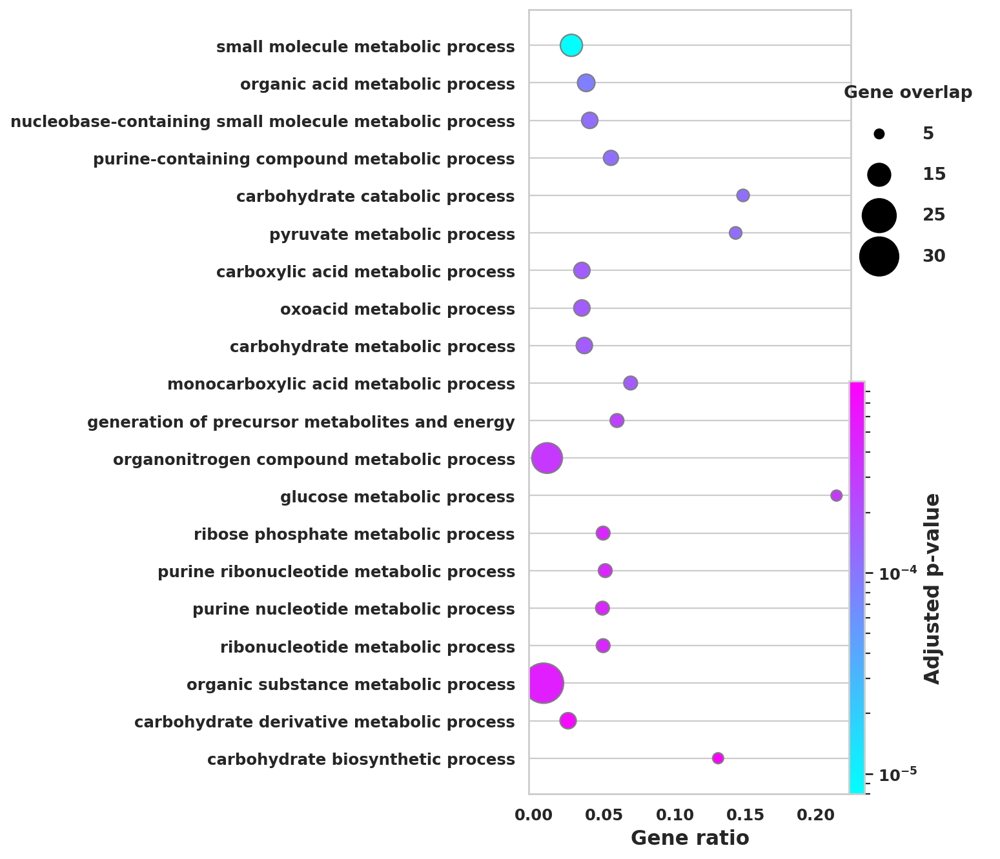

Cluster: CTCF KO_vs_WT_old_2n Hepatocytes


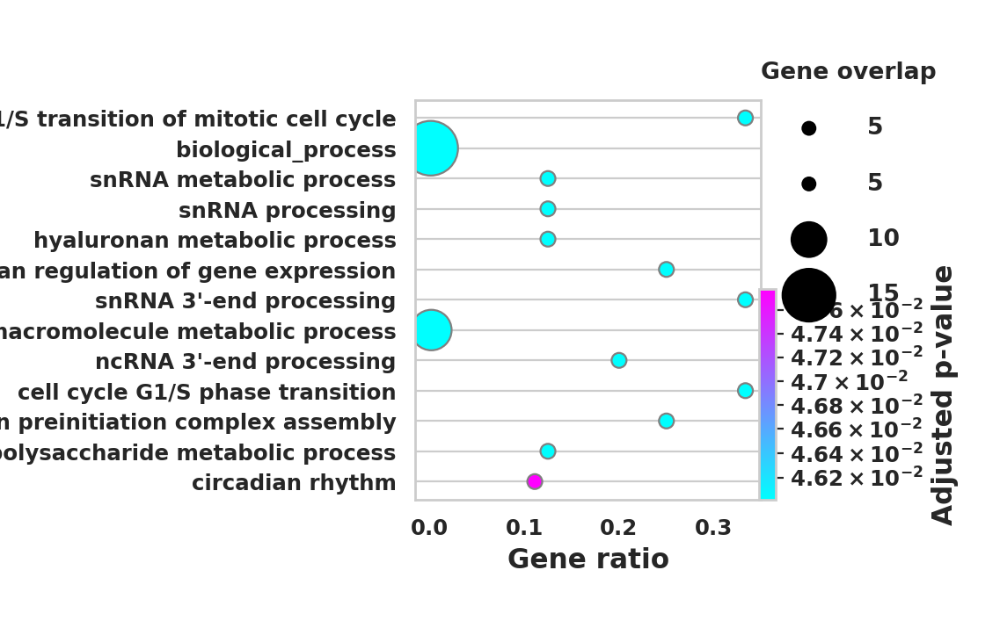

Cluster: CEBPA KO_vs_WT_young_2n Hepatocytes


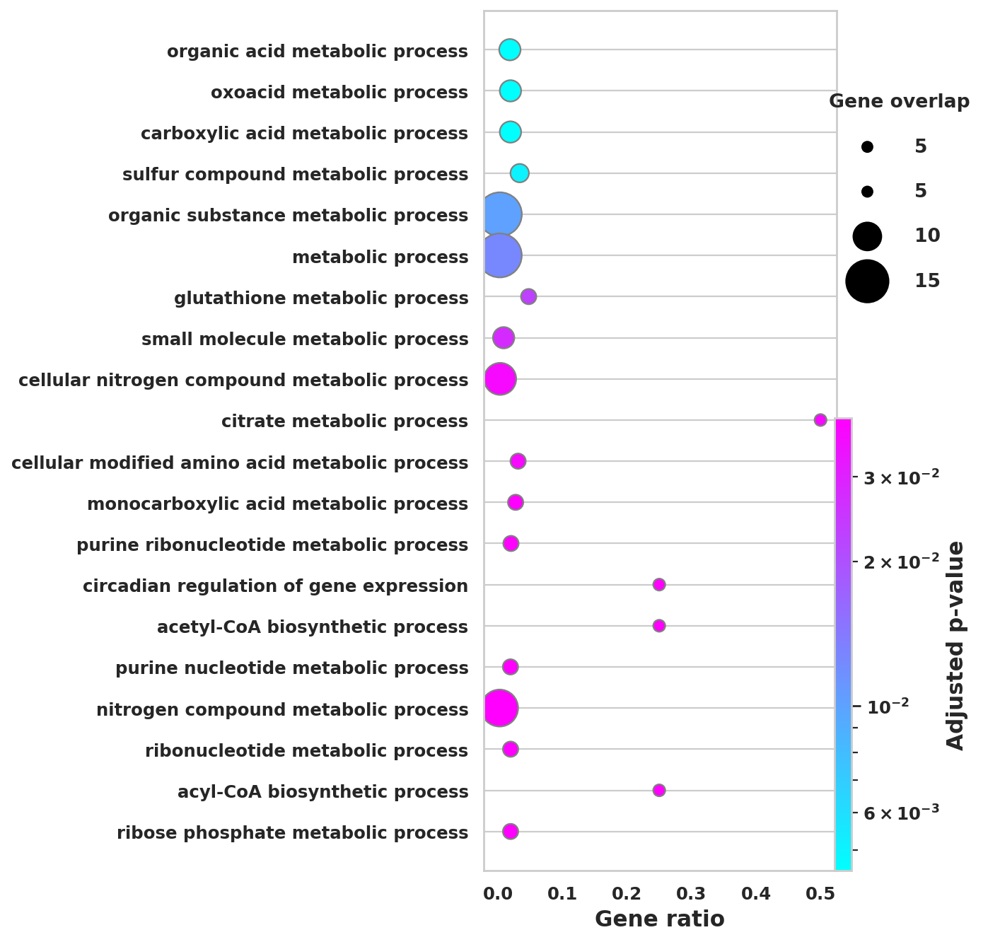

Cluster: CEBPA KO_vs_WT_old_2n Hepatocytes


In [33]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust], 
                    save= './figures/' + today+ '_'+ clust + '_GOBP_high_in_WT_condition_top100')

## Biological Process KEGG term enrichment

In [34]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [35]:
test_results = dict()
for file in meta_files: 
    if file.startswith("DE_test_KO_"):
        title = (file.split('DE_test_KO_')[1]).split('_gene_expression_210406_filter25.csv')[0]
        print(file)
        test_results[title] = pd.read_csv(data_dir + file , index_col=0)

DE_test_KO_CEBPA KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_old_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_HNF4 KO_vs_WT_young_4n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CTCF KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_young_2n Hepatocytes_gene_expression_210406_filter25.csv
DE_test_KO_CEBPA KO_vs_WT_old_2n Hepatocytes_gene_expression_210406_filter25.csv


In [36]:
de_signif = test_results

In [37]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['C57Bl6/J_pvals_adj']<0.05, 
                                  np.abs(de_tmp['C57Bl6/J_log2FC'])>0.5)
                                  ]
    if sum(de_up['C57Bl6/J_log2FC']>0)>0:
        de_up_tmp = de_up.loc[de_up['C57Bl6/J_log2FC']>0].sort_values('C57Bl6/J_pvals_adj', ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster CEBPA KO_vs_WT_young_4n Hepatocytes:
             p_value  term_size  intersection_size    recall  \
native                                                         
KEGG:00000  0.000228       7213                 45  0.006239   
KEGG:00120  0.001659         18                  3  0.166667   
KEGG:04610  0.009194         90                  4  0.044444   
KEGG:04979  0.017393         49                  3  0.061224   
KEGG:05171  0.018657        217                  5  0.023041   
KEGG:05322  0.036980         73                  3  0.041096   
KEGG:01521  0.038316         78                  3  0.038462   

                                                 name  \
native                                                  
KEGG:00000                             KEGG root term   
KEGG:00120             Primary bile acid biosynthesis   
KEGG:04610        Complement and coagulation cascades   
KEGG:04979                     Cholesterol metabolism   
KEGG:05171             Coronavirus d

Save results to file.

In [38]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_KEGG_high_KO.csv')

Plot gene set enrichment analysis.

Cluster: CEBPA KO_vs_WT_young_4n Hepatocytes


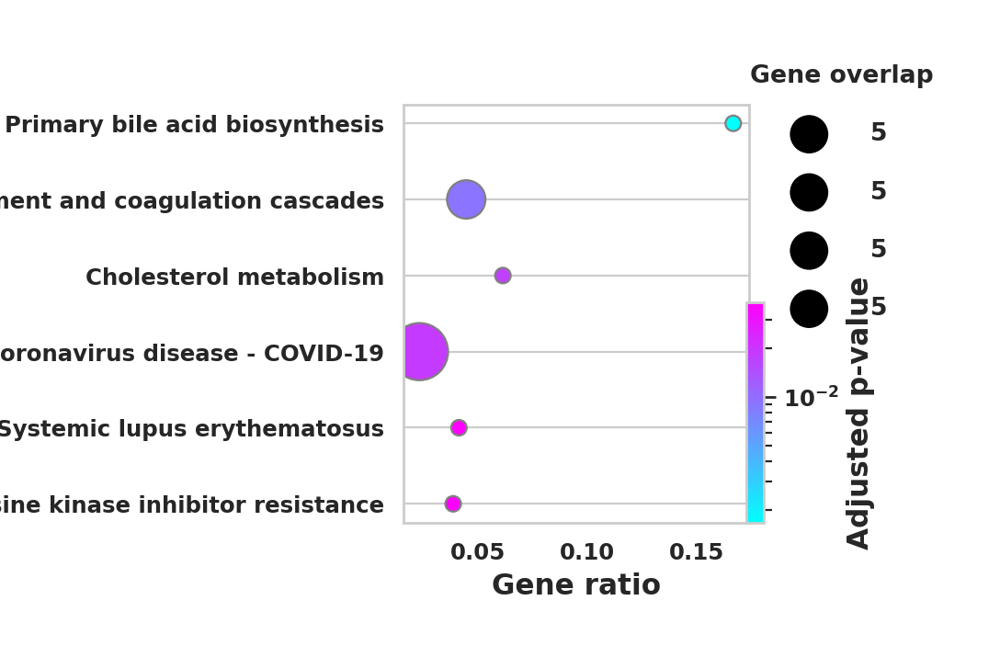

Cluster: CTCF KO_vs_WT_old_4n Hepatocytes


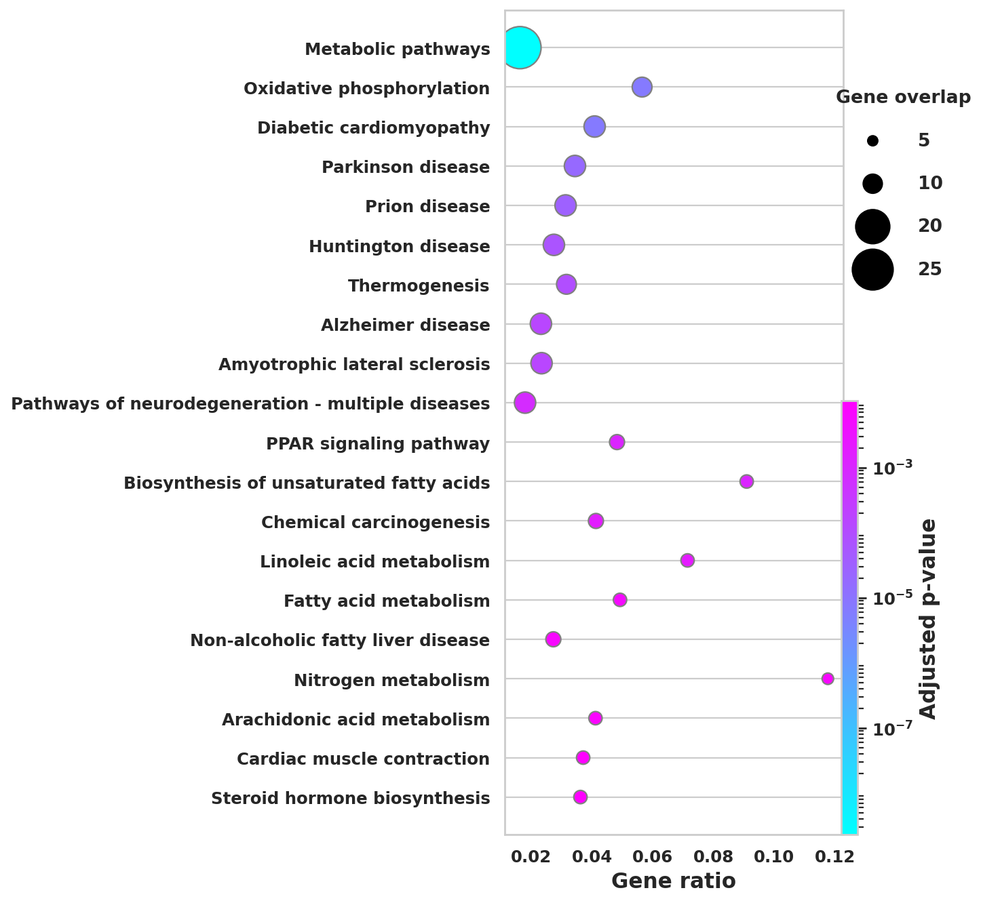

Cluster: CEBPA KO_vs_WT_old_4n Hepatocytes


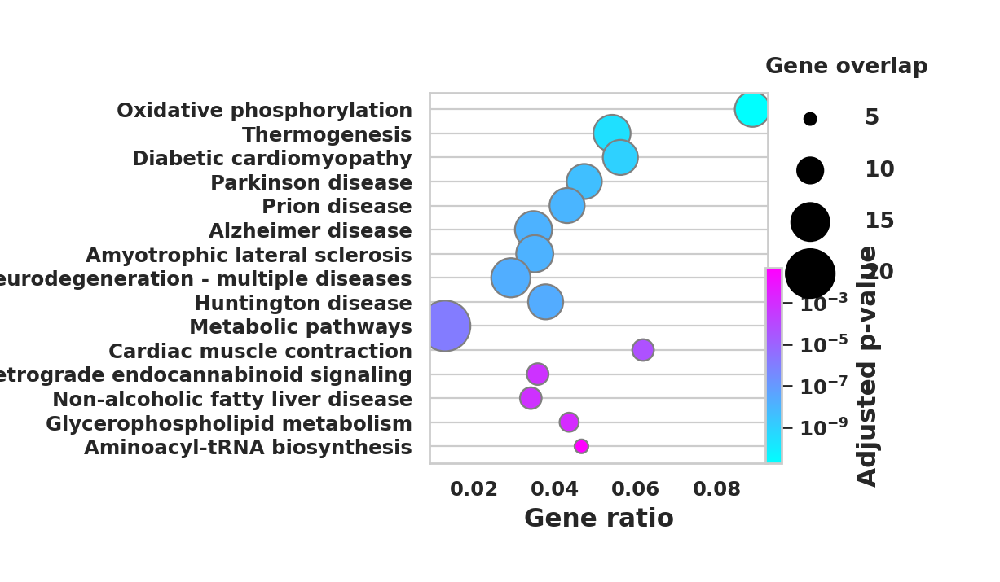

Cluster: CTCF KO_vs_WT_young_4n Hepatocytes


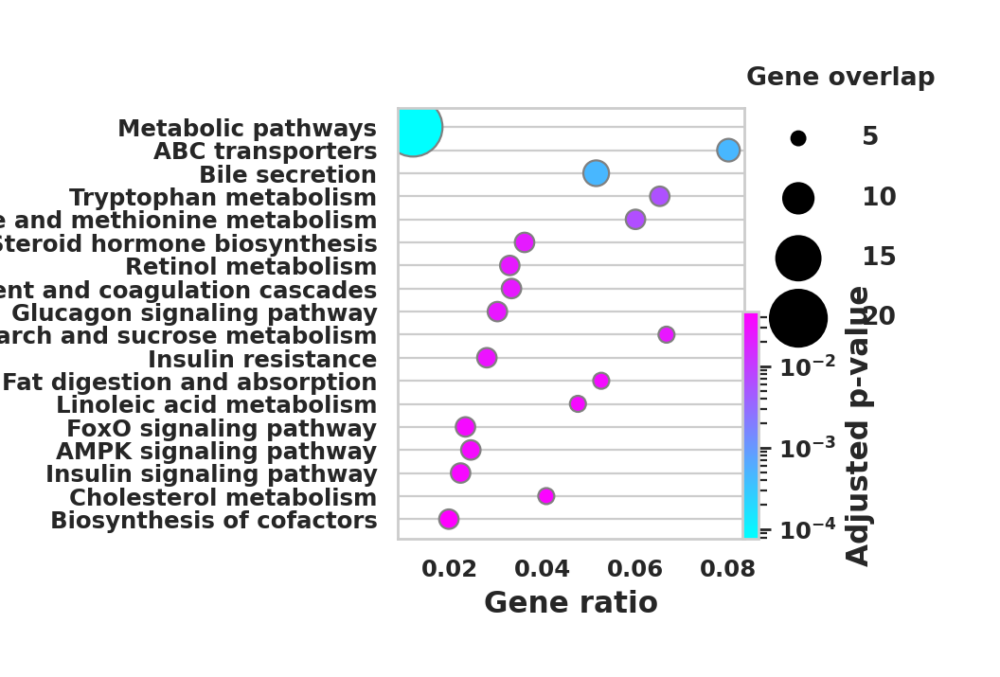

Cluster: HNF4 KO_vs_WT_old_2n Hepatocytes


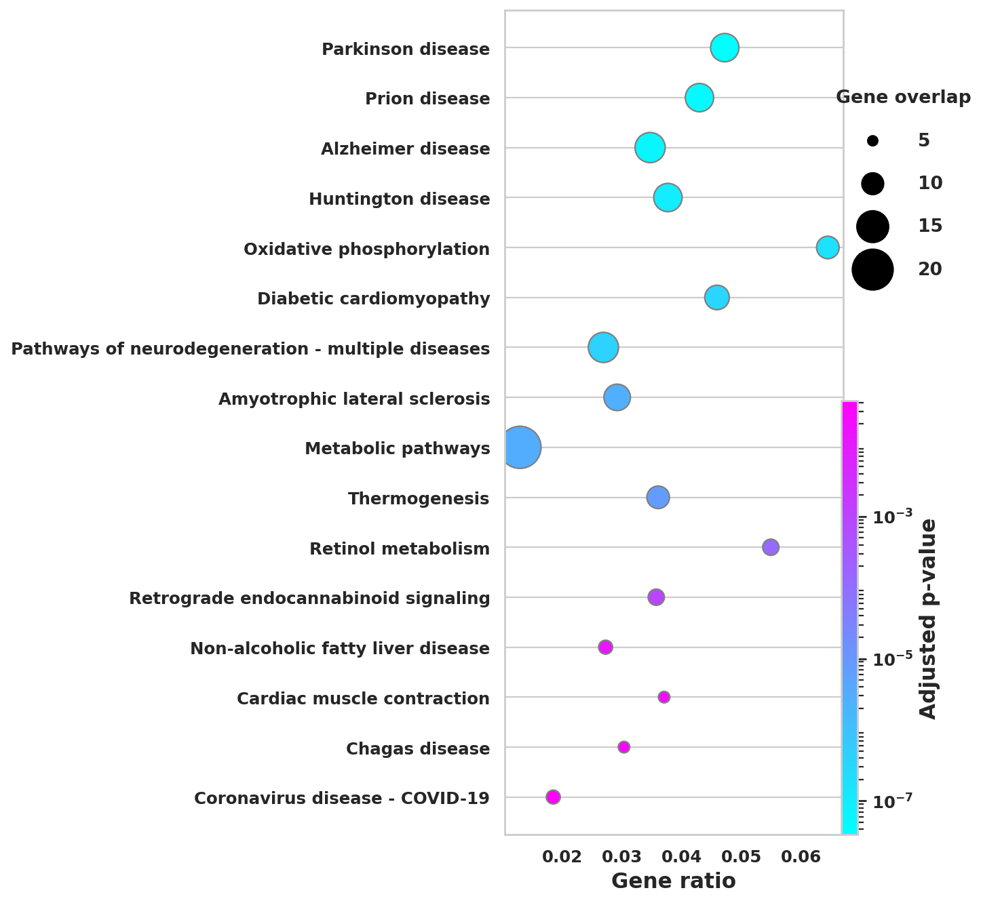

Cluster: HNF4 KO_vs_WT_young_2n Hepatocytes
Cluster: CTCF KO_vs_WT_young_2n Hepatocytes


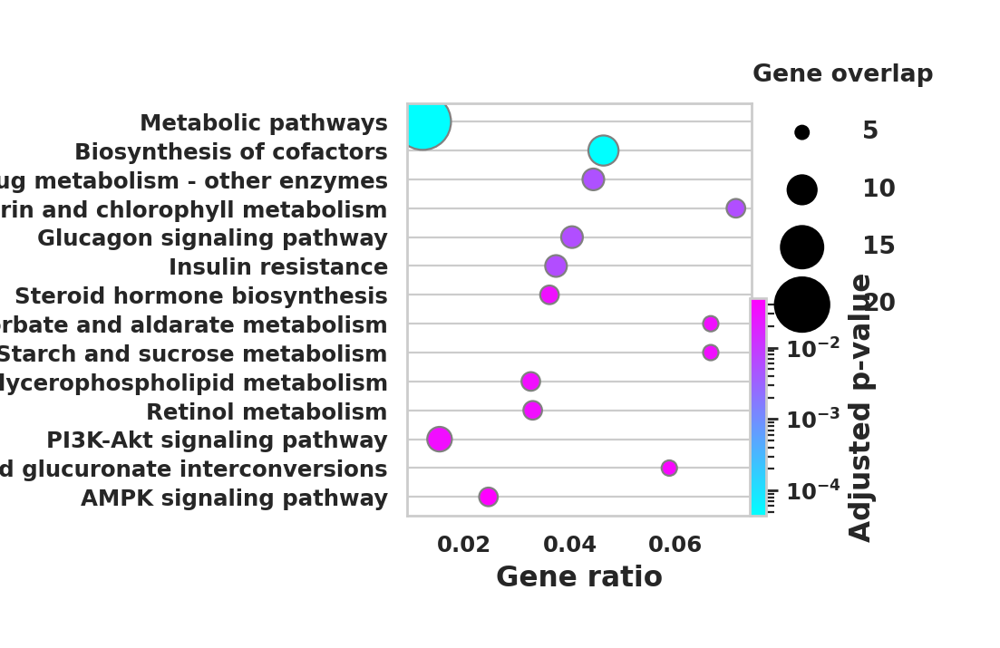

Cluster: HNF4 KO_vs_WT_old_4n Hepatocytes


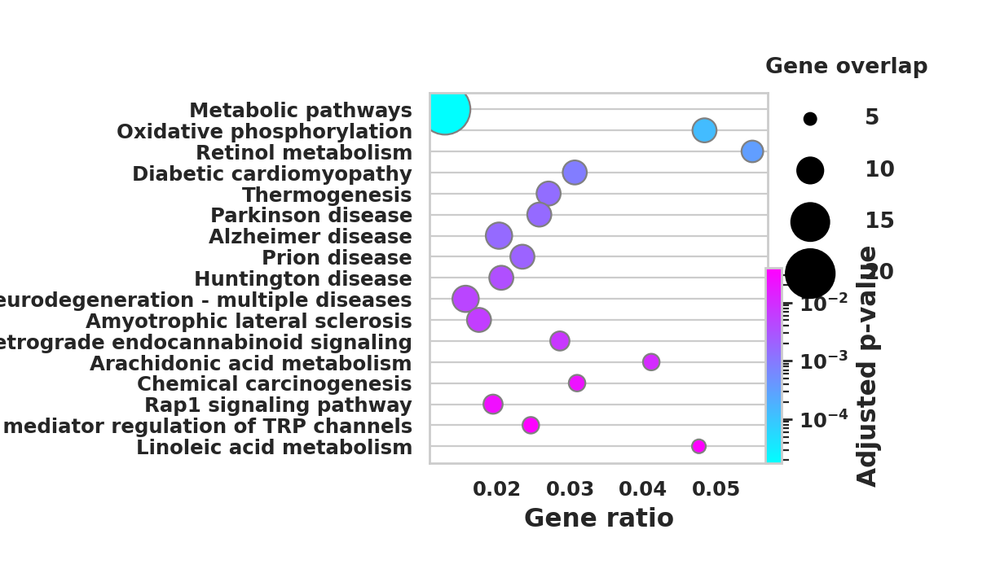

Cluster: HNF4 KO_vs_WT_young_4n Hepatocytes


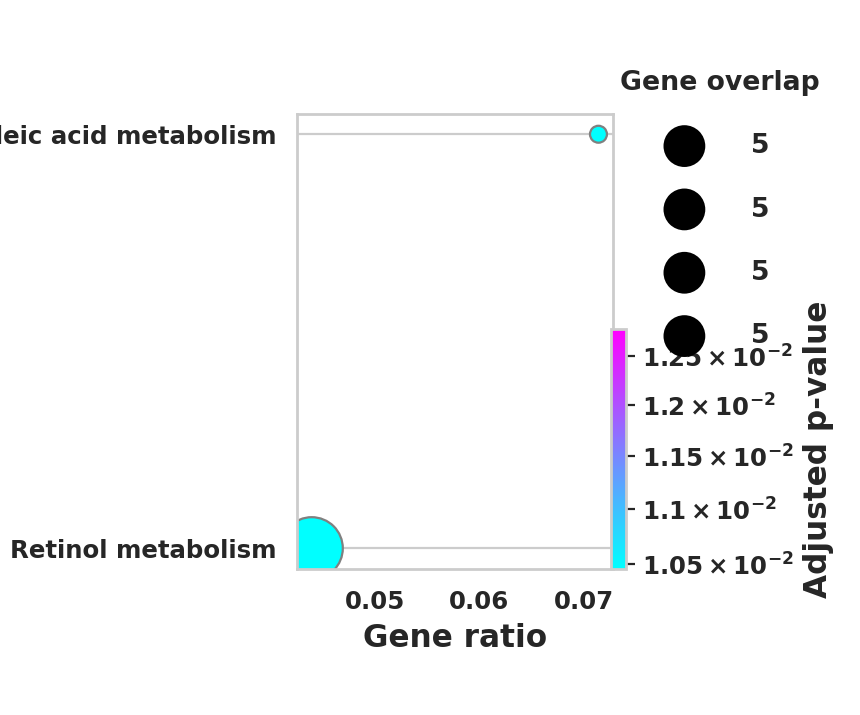

Cluster: CTCF KO_vs_WT_old_2n Hepatocytes


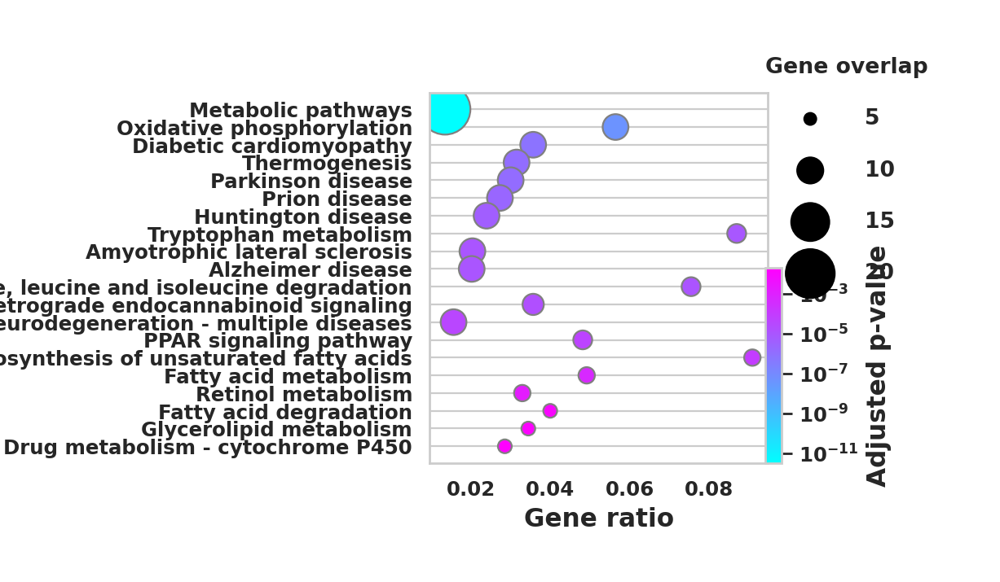

Cluster: CEBPA KO_vs_WT_young_2n Hepatocytes
Cluster: CEBPA KO_vs_WT_old_2n Hepatocytes


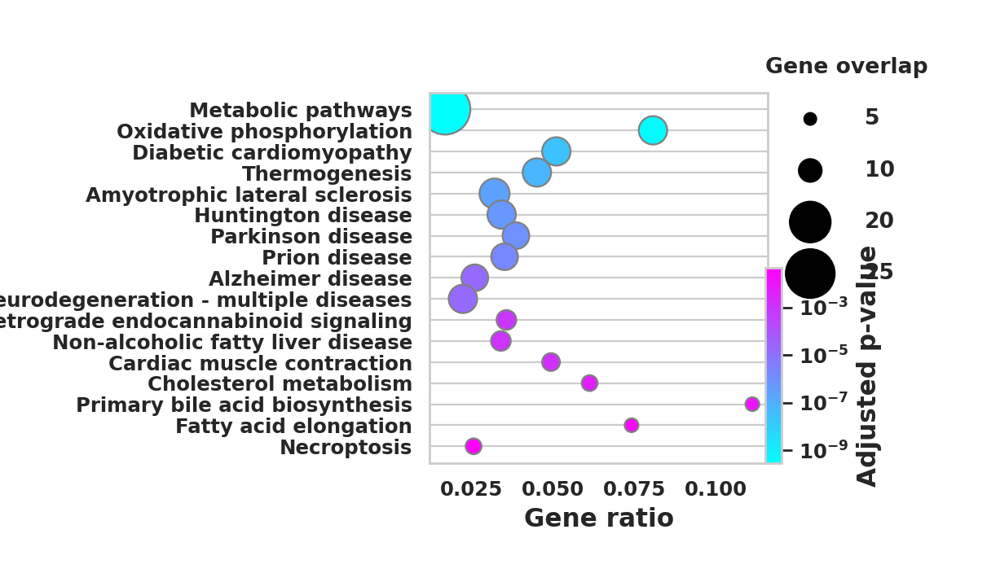

In [48]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        #remove KEGG root term and plot
        if np.in1d(['KEGG:00000'],de_gobp_enrich[clust].index)[0]:
            de_gobp_enrich[clust] = de_gobp_enrich[clust].drop('KEGG:00000')
        
        plot_enrich(de_gobp_enrich[clust], 
                    save= './figures/' + today+ '_'+ clust + '_KEGG_high_in_KO_condition_top100')
        

In [49]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    de_tmp = de_signif[clust]
    de_up = de_tmp.loc[np.logical_and(de_tmp['C57Bl6/J_pvals_adj']<0.05, 
                                  np.abs(de_tmp['C57Bl6/J_log2FC'])>0.5)
                                  ]
    if sum(de_up['C57Bl6/J_log2FC']<0)>0:
        de_up_tmp = de_up.loc[de_up['C57Bl6/J_log2FC']<0].sort_values('C57Bl6/J_pvals_adj', 
                                                                 ascending=True)
        tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=de_up_tmp['gene_name'].values.tolist()[:100])
        #print(de_up_tmp['gene_name'].values.tolist()[:100])
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        print(de_gobp_enrich[clust].iloc[:20,:])

Cluster CEBPA KO_vs_WT_young_4n Hepatocytes:
                 p_value  term_size  intersection_size    recall  \
native                                                             
KEGG:01100  4.963827e-15       1480                 30  0.020270   
KEGG:00000  9.140769e-06       7213                 45  0.006239   
KEGG:04910  9.140769e-06        134                  7  0.052239   
KEGG:00983  9.579689e-06         90                  6  0.066667   
KEGG:04152  4.594607e-05        122                  6  0.049180   
KEGG:00051  4.863886e-05         32                  4  0.125000   
KEGG:04922  2.094452e-04         99                  5  0.050505   
KEGG:04931  2.671234e-04        107                  5  0.046729   
KEGG:01200  2.959990e-04        112                  5  0.044643   
KEGG:00010  3.953208e-04         61                  4  0.065574   
KEGG:00980  6.327252e-04         72                  4  0.055556   
KEGG:01230  6.327252e-04         72                  4  0.055556   
KEG

Save results to file.

In [51]:
for clust in de_gobp_enrich.keys():
    de_gobp_enrich[clust].to_csv(data_dir + today + '_' + clust + '_KEGG_high_WT.csv')

Plot gene set enrichment analysis.

Cluster: CEBPA KO_vs_WT_young_4n Hepatocytes


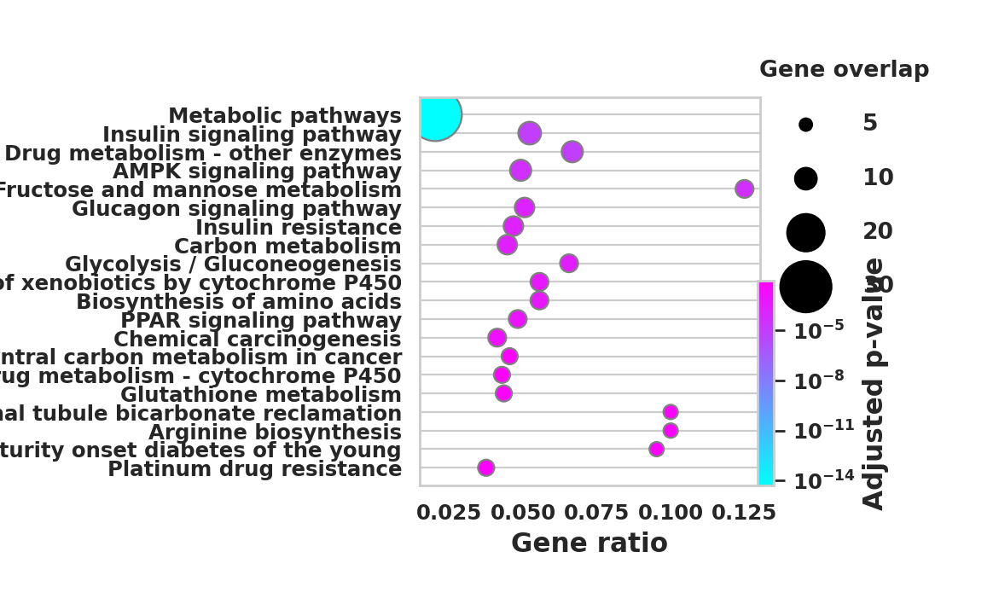

Cluster: CTCF KO_vs_WT_old_4n Hepatocytes


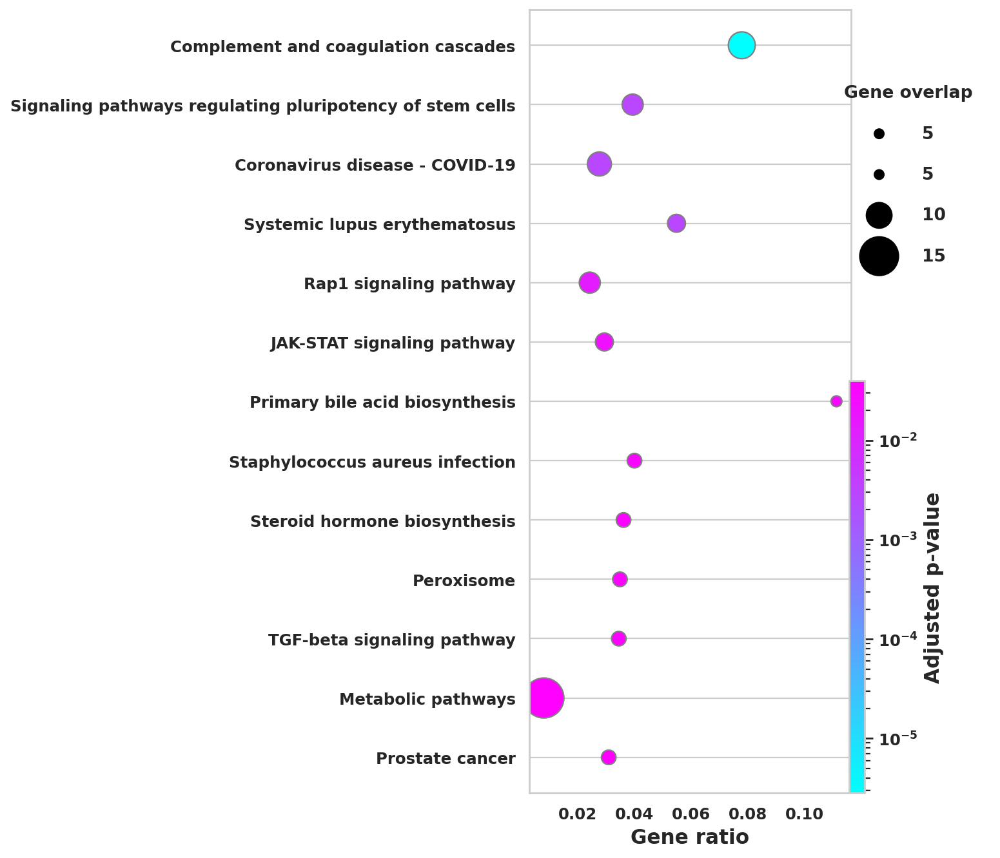

Cluster: CEBPA KO_vs_WT_old_4n Hepatocytes


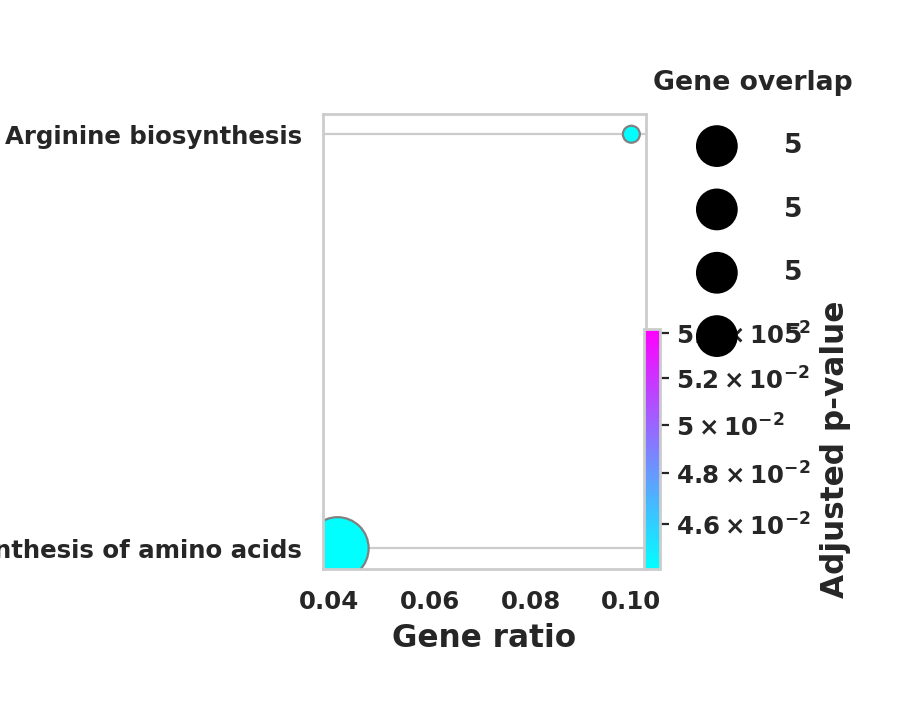

Cluster: CTCF KO_vs_WT_young_4n Hepatocytes


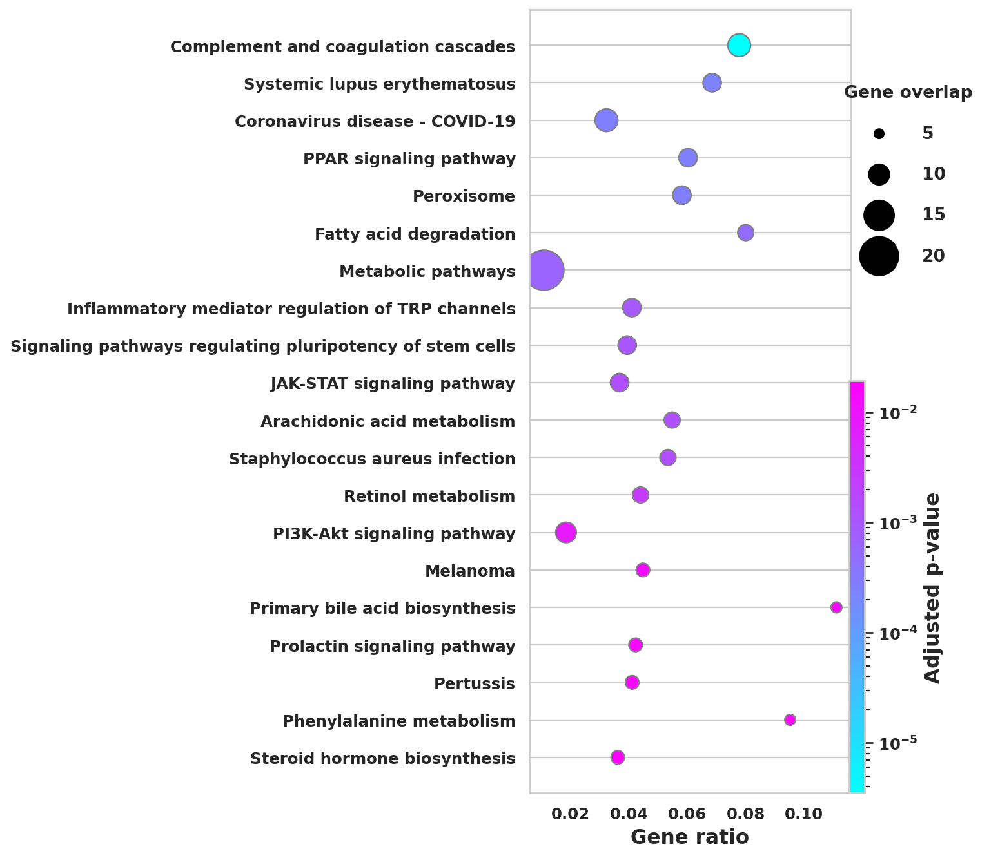

Cluster: HNF4 KO_vs_WT_old_2n Hepatocytes


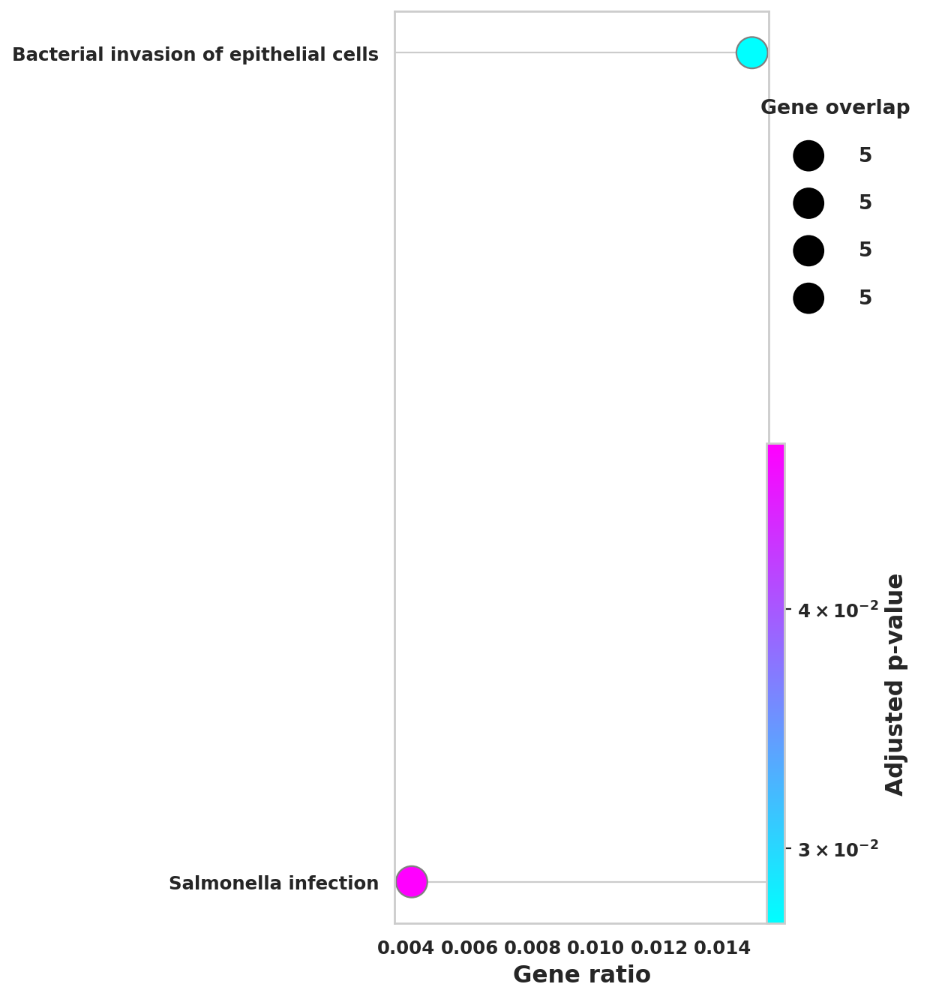

Cluster: HNF4 KO_vs_WT_young_2n Hepatocytes


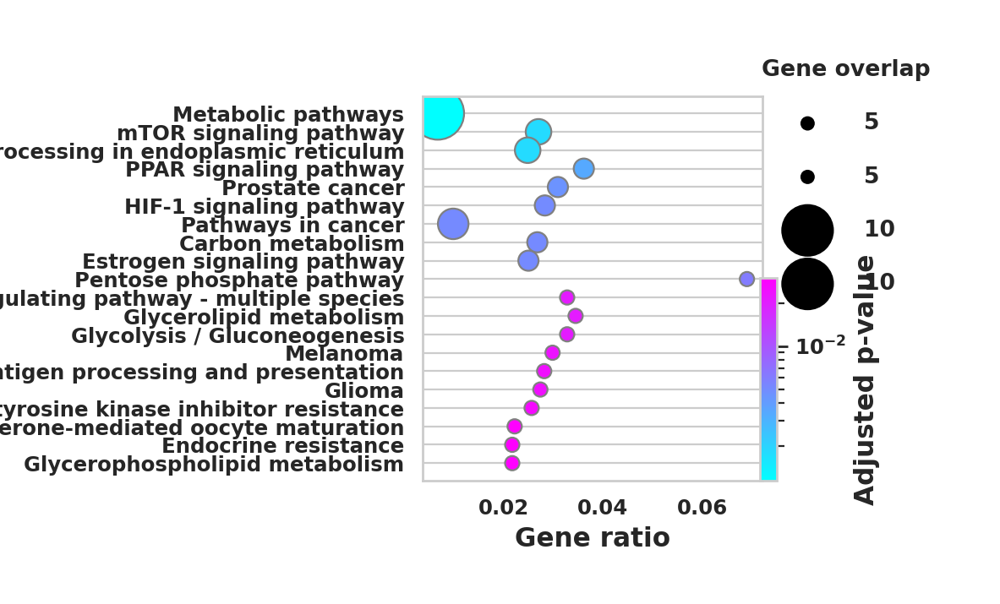

Cluster: CTCF KO_vs_WT_young_2n Hepatocytes


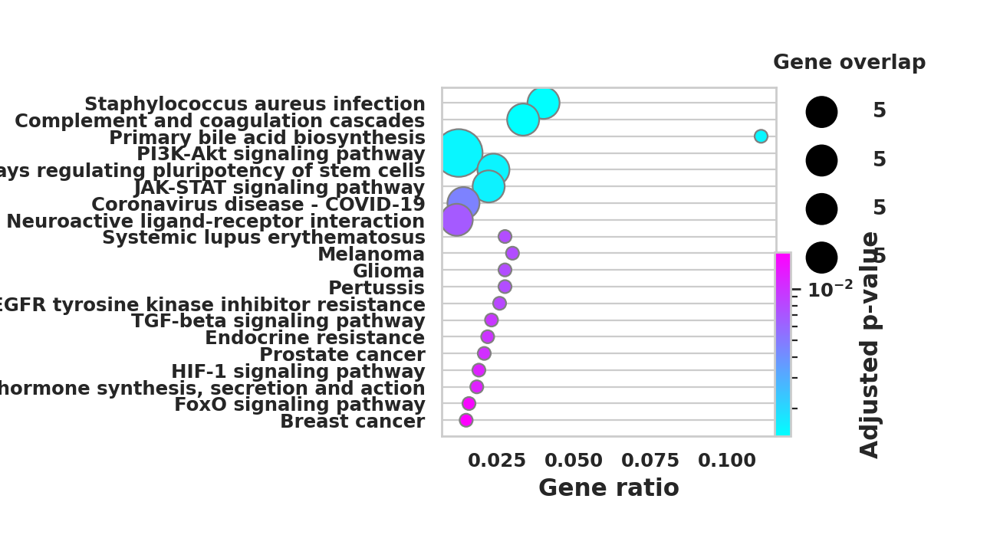

Cluster: HNF4 KO_vs_WT_old_4n Hepatocytes


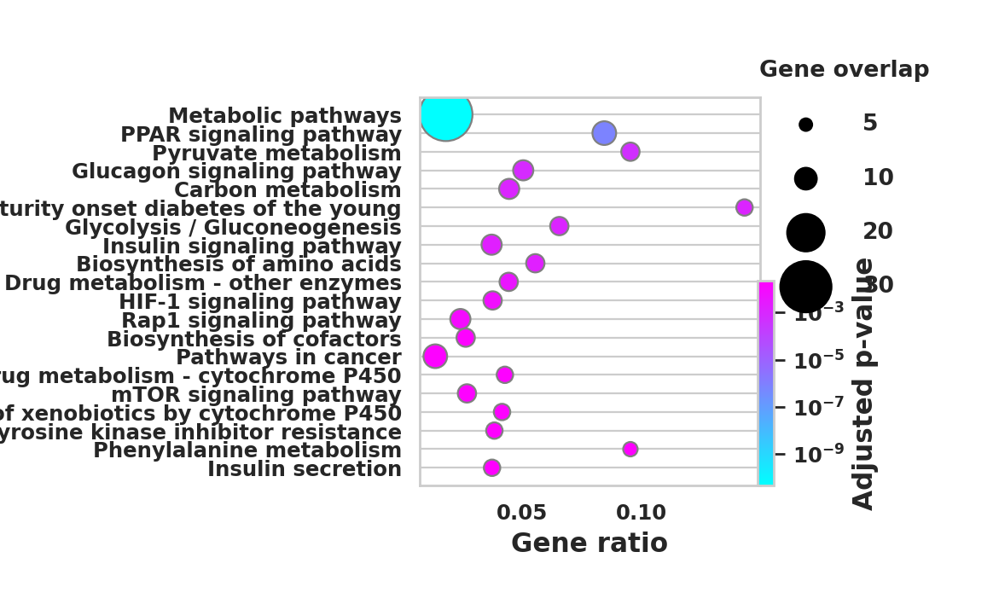

Cluster: HNF4 KO_vs_WT_young_4n Hepatocytes


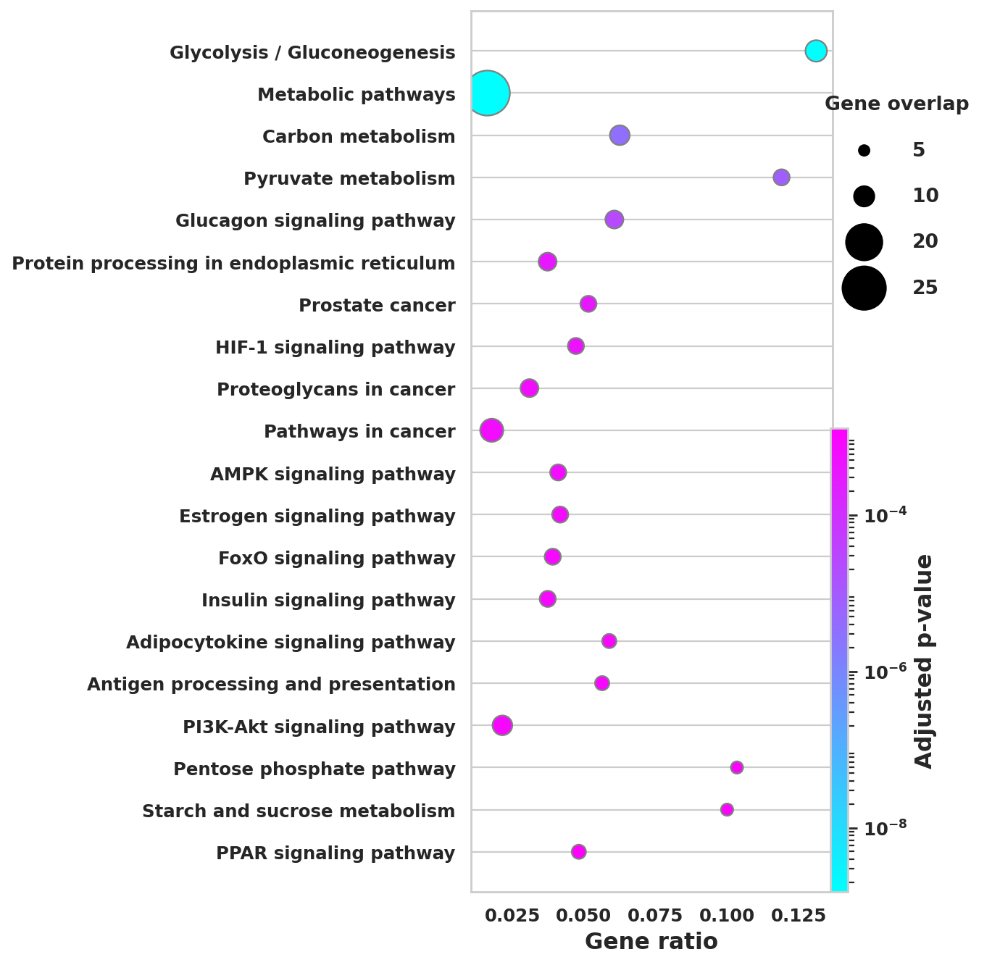

Cluster: CTCF KO_vs_WT_old_2n Hepatocytes


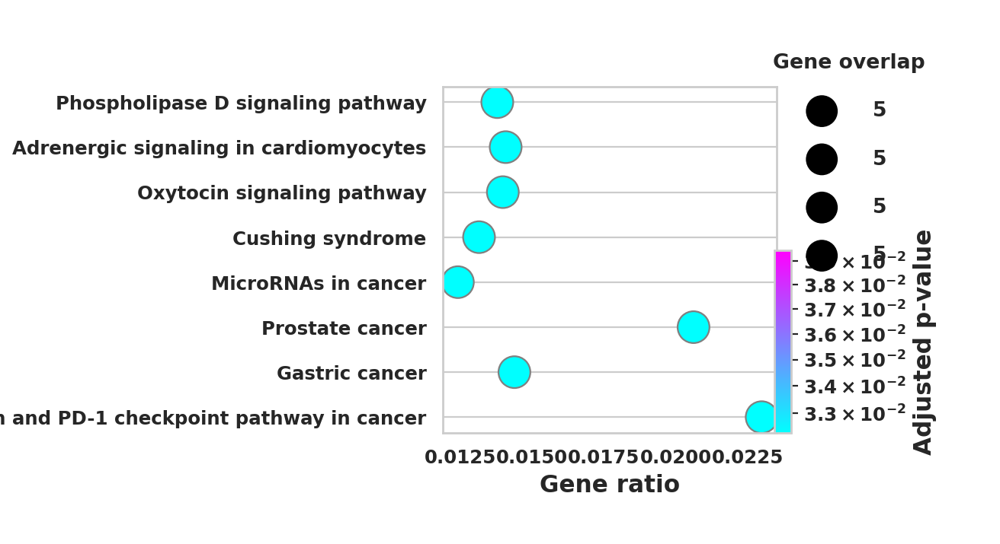

Cluster: CEBPA KO_vs_WT_young_2n Hepatocytes


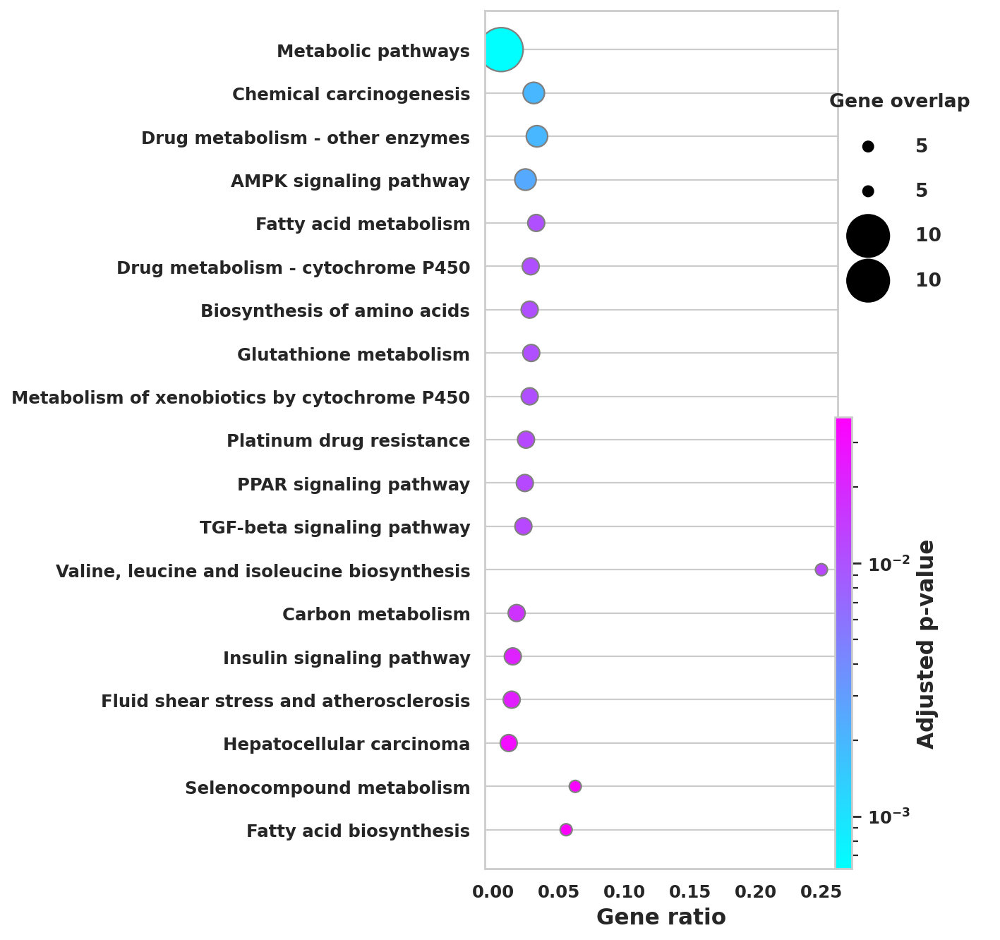

Cluster: CEBPA KO_vs_WT_old_2n Hepatocytes


In [56]:
rcParams['figure.figsize']=(5,10)
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if np.in1d(['KEGG:00000'],de_gobp_enrich[clust].index)[0]:
            de_gobp_enrich[clust] = de_gobp_enrich[clust].drop('KEGG:00000')
    if len(de_gobp_enrich[clust])>0:    
        plot_enrich(de_gobp_enrich[clust], 
                    save= './figures/' + today+ '_'+ clust + '_KEGG_high_in_WT_condition_top100')

# Perform additional GO/KEGG term analysis on custom lists

In [18]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

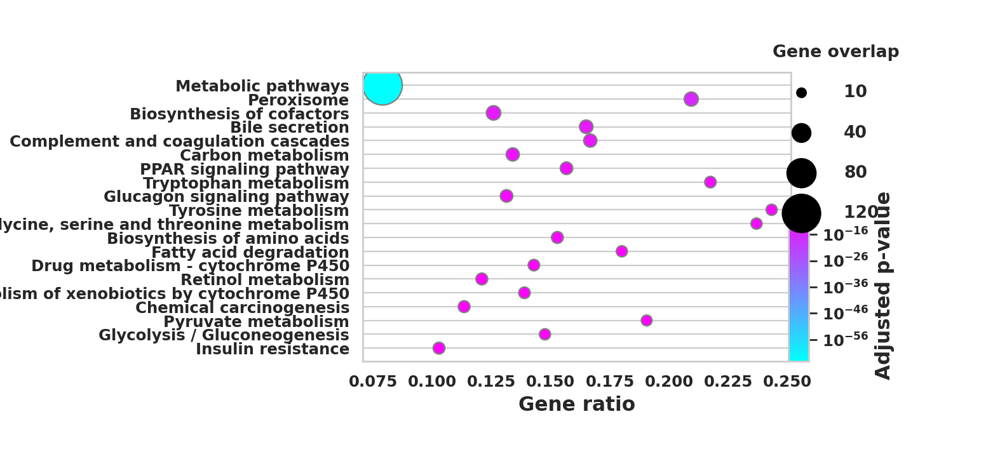

In [33]:
tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=go_spec_liver['Gene'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if np.in1d(['KEGG:00000'],tmp_out.index)[0]:
    tmp_out = tmp_out.drop('KEGG:00000')
if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_KEGG_high_in_liver_specific_gene_set.pdf')

In [34]:
tmp_out.to_csv(data_dir + today + '_KEGG_high_in_liver_specific_gene_set.csv')

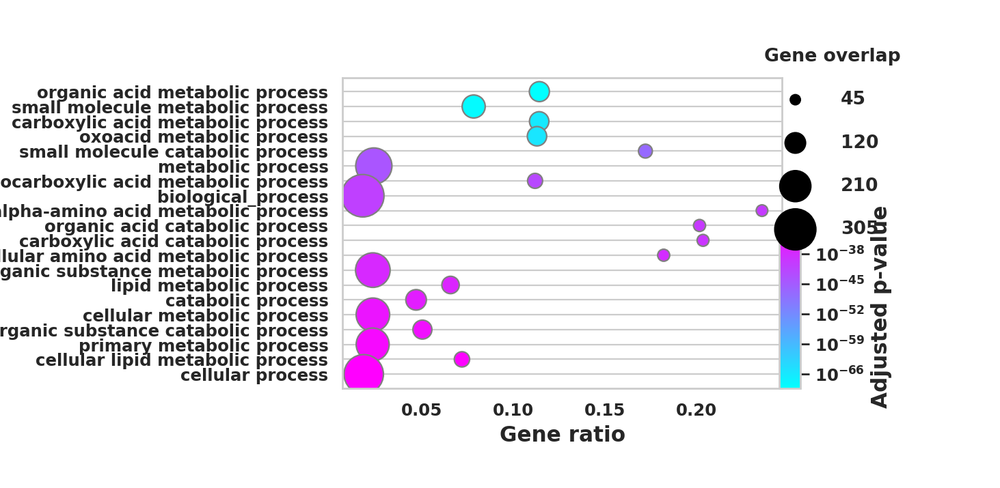

In [35]:
tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=go_spec_liver['Gene'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_GOBP_high_in_liver_specific_gene_set.pdf')

In [36]:
tmp_out.to_csv(data_dir + today + '_GOBP_high_in_liver_specific_gene_set.csv')

Test liver unspecific, unchanged genes.

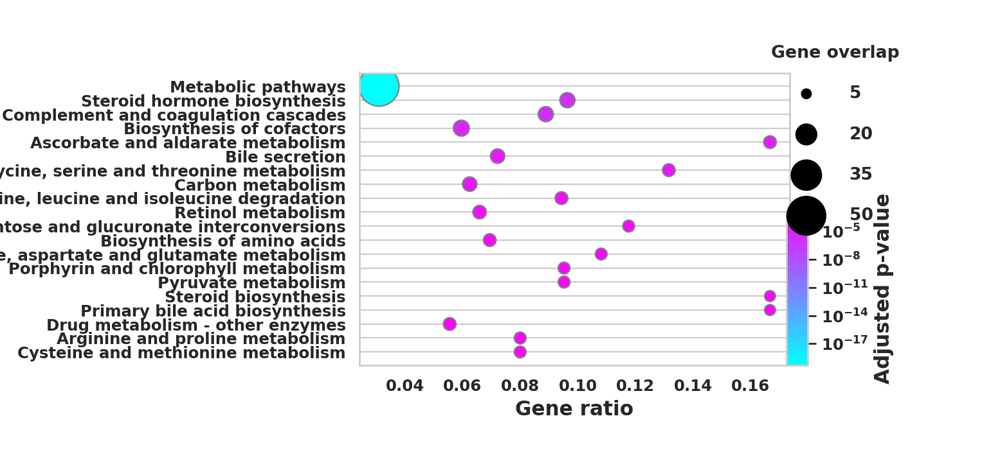

In [37]:
tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=go_unspec_liver['Gene'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if np.in1d(['KEGG:00000'],tmp_out.index)[0]:
    tmp_out = tmp_out.drop('KEGG:00000')
if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_KEGG_high_in_liver_unspecific_gene_set.pdf')

In [38]:
tmp_out.to_csv(data_dir + today + '_KEGG_high_in_liver_unspecific_gene_set.csv')

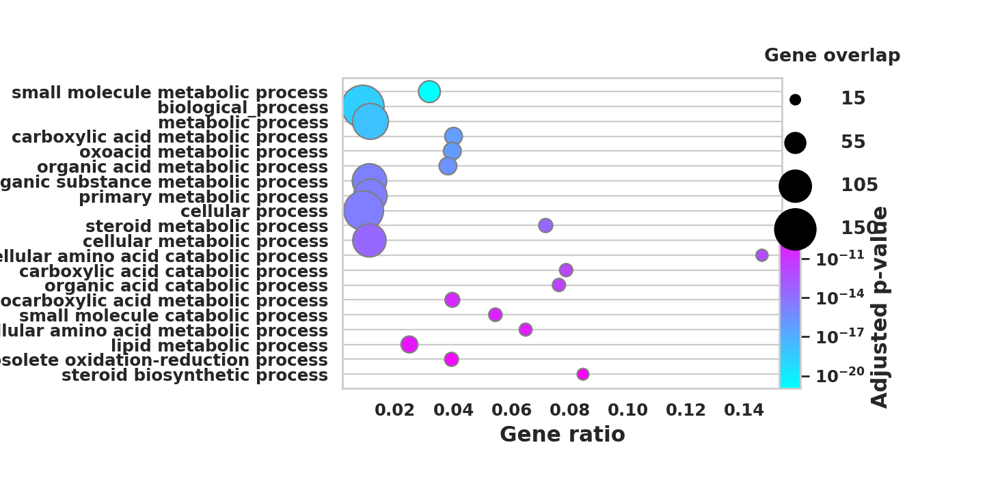

In [39]:
tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=go_unspec_liver['Gene'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_GOBP_high_in_liver_unspecific_gene_set.pdf')

In [40]:
tmp_out.to_csv(data_dir + today + '_GOBP_high_in_liver_unspecific_gene_set.csv')

# Perform GSEA for unchanged genes

In [20]:
gp = gprofiler.GProfiler(return_dataframe=True, user_agent='g:GOSt')

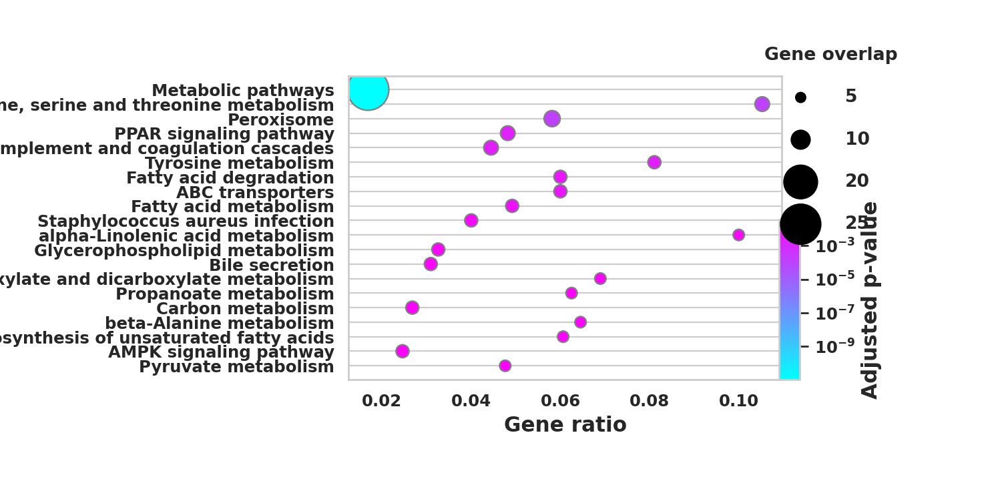

In [21]:
tmp = gp.profile(organism='mmusculus', sources=['KEGG'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=unchanged_genes['Genes'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if np.in1d(['KEGG:00000'],tmp_out.index)[0]:
    tmp_out = tmp_out.drop('KEGG:00000')
if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_KEGG_high_in_unchanged_gene_set.pdf')

In [22]:
tmp_out.to_csv(data_dir + today + '_KEGG_high_in_unchanged_gene_set.csv')

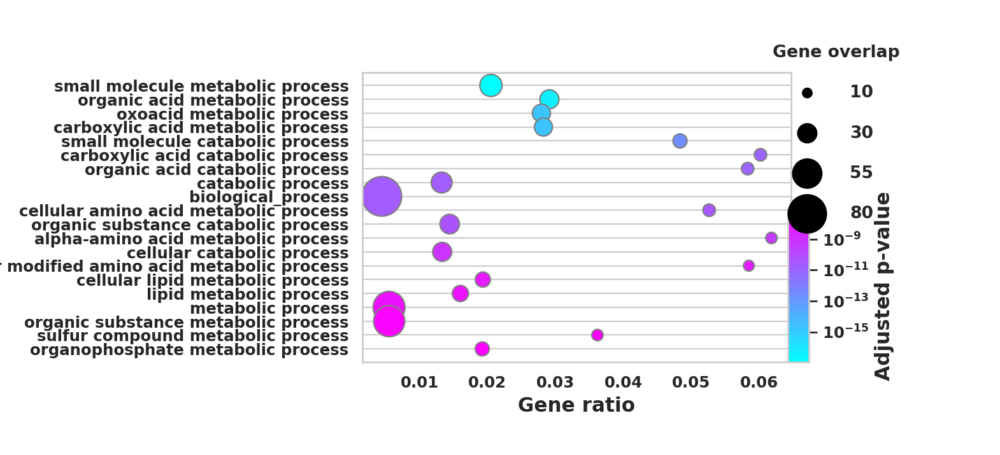

In [23]:
tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                         no_evidences=False, #return involved genes
                     query=unchanged_genes['Genes'].values.tolist())
if tmp is not None:
    tmp.set_index('native', inplace=True)
    tmp_out = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1,13]]

if len(tmp_out)>0:   
    rcParams['figure.figsize']= (15,10)
    plot_enrich(tmp_out, 
                save= './figures/' + today+ '_GOBP_high_in_unchanged_gene_set.pdf')

In [24]:
tmp_out.to_csv(data_dir + today + '_GOBP_high_in_unchanged_gene_set.csv')